In [4]:
# To ignore all warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
import matplotlib.pyplot as plt
import numpy as np, numpy.random
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import calendar
from sklearn.linear_model import LinearRegression
import plotly.express as px
from IPython.display import Markdown as md
import random as rand
from matplotlib import gridspec
import yfinance as yf
from datetime import datetime
# import getFamaFrenchFactors as gff
from pandas.tseries.offsets import DateOffset
from statsmodels.formula.api import ols
import statsmodels.api as sm
import random
# yf.pdr_override()
import pulp
from sklearn.preprocessing import LabelEncoder
import pandas_datareader.data as reader
import yfinance as yf
import pandas as pd
import requests
# import getFamaFrenchFactors as gff
from pulp import LpProblem, LpMaximize, LpVariable, LpMinimize, LpBinary, lpSum
from pulp import *

In [3]:
: 0.2.36

SyntaxError: invalid syntax (1172509144.py, line 1)

In [5]:
import getFamaFrenchFactors as gff

In [6]:
yf.pdr_override()


In [65]:
def get_spy(start,end):
  
    global tickers
    requests.packages.urllib3.disable_warnings() 
    # Fetch HTML content
    response = requests.get('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies', verify=False)
    html_content = response.content
    # Read HTML content into pandas DataFrame
    list_of_dfs = pd.read_html(html_content)
    wikitable_sp_500 = list_of_dfs[0]
    sp500_symbols = wikitable_sp_500['Symbol']#Converting SP_500 tickers into list 
    tickers = sp500_symbols.to_list()#Remove some tickers as they create an error for the yfinance api
    tickers[65] = 'BRK-B'
    tickers[81] = 'BF-B'
    tickers.remove('BF-B')
    tickers.remove('BRK-B')#Start Date for In Sample Historical Data
    global monthly_data
    global base_w
    monthly_data = yf.download(tickers,start=start,end=end,interval='1mo')#Reformat Date Index 
    monthly_data.index = pd.to_datetime(monthly_data.index)
    monthly_data = monthly_data.tz_localize(None)#Turn Adj Close prices into pct returns
    monthly_data = monthly_data['Adj Close'].pct_change()#Drop First row NaN values
    monthly_data = monthly_data.drop(monthly_data.index[0])#Drop if stock doesnt have data starting from the first index date
    monthly_data = monthly_data.dropna(axis=1)#Assign equal weight as base weights
    
    base_w = {k: 1/len(monthly_data.columns) for k in monthly_data.columns}
    base_w = pd.DataFrame.from_dict(base_w, orient='index', columns=['Weight'])#Getting SP_500 data
    spy = pd.DataFrame(yf.download('^GSPC',start=start,end=end,interval='1mo')['Adj Close'].pct_change())#Dropping First Row(NaN) and formatting index to match monthly_data 
    spy = spy.drop(spy.index[0]).tz_localize(None)#Adding SP_500 data to monthly_data
    monthly_data['SP_500'] = spy['Adj Close']
    #Adjusting tickers list as some tickers will not be included in the monthly_data if there is no data for test date range
    
    tickers = list(monthly_data.columns[:-1])
    tick_index = tickers + ['SP_500']

    

In [8]:
# Creates tickers ([]), monthly_data (DF), and base_w ([])
def get_spy2(start,end):
    ### Get tickers + setup
    global tickers
    requests.packages.urllib3.disable_warnings()
    # Fetch HTML content
    response = requests.get('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies', verify=False)
    html_content = response.content
    # Read HTML content into pandas DataFrame
    list_of_dfs = pd.read_html(html_content)
    wikitable_sp_500 = list_of_dfs[0]
    sp500_symbols = wikitable_sp_500['Symbol']
    tickers = sp500_symbols.to_list() # Converting SP_500 tickers into list 
    # Remove some tickers as they create an error for the yfinance api
    # print('\namogus\n',tickers,'amogus\n')
    # tickers[65] = 'BRK-B'
    # tickers[81] = 'BF-B'
    try:
        tickers.remove('BF-B')
        tickers.remove('BRK-B')
    except:
        print('\n')
    try:
        tickers.remove('BRK.B')
        tickers.remove('BF.B')
    except:
        print('\n')

    ### Import the monthly data
    global monthly_data
    global base_w
    monthly_data = yf.download(tickers,start=start,end=end,interval='1mo') # Reformat Date Index 
    monthly_data.index = pd.to_datetime(monthly_data.index)
    monthly_data = monthly_data.tz_localize(None)
    monthly_data = monthly_data['Adj Close'].pct_change() # Turn Adj Close prices into pct returns
    monthly_data = monthly_data.drop(monthly_data.index[0]) #Drop First row NaN values
    monthly_data = monthly_data.dropna(axis=1) # Drop if stock doesnt have data starting from the first index date
    '''
    Structure of monthly_data:
    rows: new date
    columns: various tickers drawn from the S&P 500
    '''

    # Assign equal weight as base weights
    base_w = {k: 1/len(monthly_data.columns) for k in monthly_data.columns}
    base_w = pd.DataFrame.from_dict(base_w, orient='index', columns=['Weight'])
    # Getting SP_500 data
    spy = pd.DataFrame(yf.download('^GSPC',start=start,end=end,interval='1mo')['Adj Close'].pct_change())#Dropping First Row(NaN) and formatting index to match monthly_data 
    spy = spy.drop(spy.index[0]).tz_localize(None)
    monthly_data['SP_500'] = spy['Adj Close'] # Adding SP_500 data to monthly_data

    # Adjusting tickers list as some tickers will not be included in the monthly_data if there is no data for test date range
    tickers = list(monthly_data.columns[:-1]) # TODO: I don't understand how this deletes the no data columns
    tick_index = tickers + ['SP_500']

    

In [9]:
get_spy('2020-03-01','2023-01-01')

[*********************100%%**********************]  500 of 501 completed

9 Failed downloads:
['VLTO', 'SW', 'KVUE', 'GEV', 'SOLV', 'AMTM']: Exception("%ticker%: Data doesn't exist for startDate = 1583038800, endDate = 1672549200")
['GEHC']: IndexError('index 0 is out of bounds for axis 0 with size 0')
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2020-03-01 -> 2023-01-01)')
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


In [66]:
get_spy('2005-01-01','2024-01-01')

[*********************100%%**********************]  501 of 501 completed

6 Failed downloads:
['SW', 'GEV', 'SOLV', 'AMTM']: Exception("%ticker%: Data doesn't exist for startDate = 1104555600, endDate = 1704085200")
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1mo 2005-01-01 -> 2024-01-01)')
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


In [73]:
get_spy2('2005-01-01','2015-12-31')

[                       1%%                      ]  7 of 501 completed

[*********************100%%**********************]  501 of 501 completed

28 Failed downloads:
['FOX', 'VLTO', 'FTV', 'VICI', 'GEHC', 'SW', 'OTIS', 'CRWD', 'CTVA', 'KVUE', 'IR', 'GEV', 'SOLV', 'CEG', 'DOW', 'UBER', 'HWM', 'CARR', 'FOXA', 'ABNB', 'LW', 'AMTM', 'VST', 'DELL', 'MRNA', 'DAY', 'PLTR', 'INVH']: Exception("%ticker%: Data doesn't exist for startDate = 1104555600, endDate = 1451538000")
[*********************100%%**********************]  1 of 1 completed


In [70]:
monthly_data.to_csv('alldata.csv')

In [74]:
monthly_data

Ticker,A,AAPL,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,ADSK,...,WST,WTW,WY,WYNN,XEL,XOM,YUM,ZBH,ZBRA,SP_500
Date,,,,,,,,,,,,,,,,,,,,,
2005-02-01,0.085482,0.166710,0.027219,0.129322,-0.019194,0.085237,0.023126,-0.004132,-0.011959,0.011917,...,-0.011051,0.022492,0.072597,0.091672,-0.025838,0.226938,0.054695,0.089410,-0.020813,0.018903
2005-03-01,-0.075000,-0.071110,0.013698,-0.034716,-0.054795,0.087773,-0.014175,0.023453,0.046322,0.001346,...,-0.070039,-0.067762,0.030018,-0.053514,-0.030474,-0.053990,0.062116,-0.094179,-0.047724,-0.019118
2005-04-01,-0.065315,-0.134629,0.054483,-0.001249,-0.101449,-0.114461,-0.056171,-0.268104,-0.030118,0.070108,...,0.102092,-0.087338,0.001606,-0.218482,0.012445,-0.043121,-0.093612,0.046395,0.005685,-0.020109
2005-05-01,0.157108,0.102607,-0.013048,0.116529,0.072811,0.113839,0.087072,0.103391,0.008287,0.243481,...,0.061899,0.024514,-0.065005,-0.115036,0.072760,-0.014554,0.094342,-0.059445,-0.108878,0.029952
2005-06-01,-0.041233,-0.074194,0.015962,0.008959,-0.026203,-0.136171,0.008940,0.081786,-0.041781,-0.132390,...,0.007543,-0.045229,-0.000420,0.008965,0.059143,0.027806,0.015403,-0.005354,0.028900,-0.000143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-08-01,-0.113309,-0.070404,-0.102214,-0.043161,-0.085734,-0.041712,-0.042345,-0.051244,-0.030713,-0.075722,...,-0.065461,-0.073134,-0.089606,-0.272983,-0.027113,-0.050120,-0.086974,-0.004901,-0.229954,-0.062581
2015-09-01,-0.054530,-0.017389,-0.111945,0.076011,0.042325,0.046455,0.017891,-0.073186,0.039317,-0.055829,...,-0.030976,-0.049199,-0.021475,-0.288673,0.049808,-0.002583,0.002256,-0.092989,-0.076375,-0.026443
2015-10-01,0.103105,0.083409,0.113874,0.019328,0.090983,0.078326,0.065768,0.101568,0.089329,0.250340,...,0.108832,0.097106,0.084951,0.316830,0.016018,0.112844,-0.113071,0.115875,0.004572,0.082983


In [10]:
monthly_data

Ticker,A,AAPL,ABBV,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,...,WY,WYNN,XEL,XOM,XYL,YUM,ZBH,ZBRA,ZTS,SP_500
Date,,,,,,,,,,,,,,,,,,,,,
2020-04-01,0.073096,0.155374,0.078882,0.167026,-0.155657,0.134325,0.111237,0.222532,0.055714,0.079876,...,0.305927,0.421000,0.060890,0.223861,0.103946,0.261200,0.187153,0.250871,0.098734,0.126844
2020-05-01,0.149752,0.082164,0.144186,0.035071,0.174365,0.093632,0.093202,0.030566,0.058428,-0.001363,...,-0.076817,-0.026306,0.023128,-0.021519,-0.077330,0.038181,0.055472,0.137856,0.079696,0.045282
2020-06-01,0.002610,0.150492,0.059458,-0.036768,0.015237,0.064974,0.125996,0.091692,0.025319,0.016383,...,0.112432,-0.105547,-0.038905,0.002575,-0.016884,-0.026357,-0.055248,-0.020550,-0.016859,0.018388
2020-07-01,0.092365,0.165132,-0.033306,0.100733,0.073298,0.046852,0.020698,-0.063519,0.073433,-0.102091,...,0.238201,-0.027655,0.111987,-0.059034,0.123461,0.047635,0.132216,0.096894,0.106830,0.055101
2020-08-01,0.042458,0.214380,0.021377,0.091961,0.025691,0.071310,0.155451,0.017675,0.045062,0.046498,...,0.089896,0.207372,0.006228,-0.050856,0.098657,0.052718,0.044639,0.020588,0.056991,0.070065
2020-09-01,0.005178,-0.100908,-0.085413,-0.005847,-0.072606,-0.058100,-0.044722,0.003967,0.047143,0.002876,...,-0.059056,-0.178845,-0.006622,-0.123504,0.052521,-0.042811,-0.033645,-0.118905,0.032917,-0.039228
2020-10-01,0.011393,-0.060012,-0.028428,-0.034182,0.032821,-0.040179,-0.088351,0.015333,-0.005377,0.139969,...,-0.043128,0.008634,0.021157,-0.049811,0.035901,0.022234,-0.027964,0.123505,-0.041241,-0.027666
2020-11-01,0.147133,0.093607,0.245643,0.033020,0.065872,0.152853,0.070163,0.173374,0.076341,0.100785,...,0.064126,0.387546,-0.038126,0.168915,0.101331,0.133612,0.128842,0.334156,0.012808,0.107546
2020-12-01,0.013601,0.116497,0.024574,0.011736,0.120186,0.048657,0.045248,0.062194,0.020181,0.013342,...,0.154614,0.122687,-0.010244,0.107120,0.063663,0.030700,0.033329,0.015617,0.031924,0.037121


In [ ]:
get_spy('2020-03-01','2023-01-01')

[********************  41%%                      ]  206 of 501 completed

KeyboardInterrupt: 

[**********************59%%**                    ]  297 of 501 completed

[****                   9%%                      ]  46 of 501 completed

In [11]:
def famafrenchreturns():
    global ff3_monthly
    # Fama French Monthly Returns Data using getFamaFrenchFactors module
    ff3_monthly = gff.famaFrench3Factor(frequency='m')
    ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
    ff3_monthly.set_index('Date', inplace=True)
    ff3_monthly.index = ff3_monthly.index.to_period('M').to_timestamp('D')
    # Keeping Only the Dates in the monthly_data
    ff3_monthly = ff3_monthly.loc[monthly_data.index]

In [75]:
famafrenchreturns()
ff3_monthly

,Mkt-RF,SMB,HML,RF
Date,,,,
2005-02-01,0.0189,-0.0057,0.0154,0.0016
2005-03-01,-0.0197,-0.0140,0.0204,0.0021
2005-04-01,-0.0261,-0.0394,0.0007,0.0021
2005-05-01,0.0365,0.0288,-0.0064,0.0024
2005-06-01,0.0057,0.0258,0.0283,0.0023
...,...,...,...,...
2015-08-01,-0.0604,0.0033,0.0277,0.0000
2015-09-01,-0.0307,-0.0262,0.0056,0.0000
2015-10-01,0.0775,-0.0189,-0.0046,0.0000


In [163]:
famafrenchreturns()
ff3_monthly

,Mkt-RF,SMB,HML,RF
Date,,,,
2005-02-01,0.0189,-0.0057,0.0154,0.0016
2005-03-01,-0.0197,-0.0140,0.0204,0.0021
2005-04-01,-0.0261,-0.0394,0.0007,0.0021
2005-05-01,0.0365,0.0288,-0.0064,0.0024
2005-06-01,0.0057,0.0258,0.0283,0.0023
...,...,...,...,...
2015-08-01,-0.0604,0.0033,0.0277,0.0000
2015-09-01,-0.0307,-0.0262,0.0056,0.0000
2015-10-01,0.0775,-0.0189,-0.0046,0.0000


In [13]:
def to__cal_stock_betas():
    global stock_betas
    stock_betas = pd.DataFrame()
    # Iterate over the tickers list
    for col in monthly_data.columns:
        # Set the dependent variable (Return of stock i)
        y = monthly_data[col]
        # Set the independent variables (Fama French 3 Factors)
        X = ff3_monthly[['Mkt-RF','SMB','HML']]
        # Fit the multiple linear regression model
        model = LinearRegression()
        model.fit(X, y)
        # Store the results in the DataFrame
        stock_betas[col] = [model.intercept_] + list(model.coef_)
    stock_betas = stock_betas.T
    stock_betas.columns = ['Intercept','Mkt-RF','SMB','HML']

In [14]:
def to_cal_stock_price(lstart,lend):
    global stock_price
    global s_price
    global s_keys
    global s_values
    #Stock Prices on the Day of Optimization(Rebalancing)
    stock_price = pd.DataFrame(yf.download(tickers,start=lstart,end=lend,interval='1d')['Adj Close'])
    stock_price = stock_price[-1:]
    stock_price.index = pd.to_datetime(stock_price.index).tz_localize(None)
    s_price = {}
    s_keys = list(tickers)
    s_values =  list(stock_price.iloc[0])
    for key,value in zip(s_keys,s_values):
        s_price[key] = value

In [76]:
to_cal_stock_price('2005-01-01','2015-12-31')

[*********************100%%**********************]  393 of 393 completed


In [77]:
to__cal_stock_betas()

In [78]:
stock_betas


,Intercept,Mkt-RF,SMB,HML
A,0.002999,1.443030,0.559380,-0.452258
AAPL,0.018455,1.458658,-0.339353,-0.991319
ABT,0.006233,0.509099,-0.498030,-0.092071
ACGL,0.011902,0.450713,0.017271,0.287644
ACN,0.007631,0.945525,0.162079,-0.469938
...,...,...,...,...
XOM,0.002621,0.693768,-0.452628,-0.031093
YUM,0.006936,0.847699,0.407120,-0.193366
ZBH,-0.000117,0.895178,0.144371,0.451154
ZBRA,-0.002296,1.169582,0.309432,-0.562970


In [18]:
def Transaction_Costs(initialize=False):
    if initialize:
        random.seed(1)  # Set seed only during initialization
    global t_cost
    t_cost = {}
    global keys
    keys = list(tickers)
    values = list(random.uniform(.01, .02) for i in range(len(tickers)))
    for key, value in zip(keys, values):
        t_cost[key] = value

In [79]:
Transaction_Costs()

In [80]:
len(t_cost)

393

In [434]:
monthly_data.iloc[0,:].values

array([ 7.30953603e-02,  1.55373666e-01,  7.88816632e-02,  1.67025437e-01,
       -1.55657003e-01,  1.34325645e-01,  1.11236883e-01,  2.22532368e-01,
        5.57134128e-02,  7.98761425e-02,  1.98782816e-01,  4.99792718e-03,
        3.91345730e-02, -2.57351685e-02,  8.76167600e-02,  6.18973229e-02,
        2.06552947e-02, -3.28305132e-02,  6.79855871e-02,  9.57847699e-02,
        2.35125093e-01,  1.08906320e-01,  9.57243997e-02,  8.42427927e-02,
        1.17810333e-01,  1.51934915e-01,  1.67257782e-01,  1.79992943e-01,
        1.21584642e-01,  9.29964236e-02,  2.68900118e-01,  8.26956295e-02,
        1.26295802e-01,  4.62313238e-02,  1.20867143e-01,  2.12918632e+00,
        1.37484175e-01,  2.14847606e-01,  4.12469551e-01,  1.54428689e-01,
        2.76125115e-02,  1.18317780e-01,  1.65065320e-01,  8.88985723e-02,
        1.78151748e-02,  2.74127813e-02,  6.58800962e-02,  2.06052018e-01,
       -5.44454549e-02,  1.40058985e-01,  1.43825558e-02,  9.34844419e-02,
        3.58527719e-01,  

In [21]:
def error_term(weights, monthly_data, ff3_monthly, mkt_opt, smb_opt, hml_opt):
    error = 0
    for t in range(len(monthly_data)):
        stock_returns = monthly_data.iloc[t, :].values
        ff_factors = ff3_monthly.iloc[t, :].values
        portfolio_return = np.dot(weights, stock_returns - ff_factors[3])
        expected_return = mkt_opt * ff_factors[0] + smb_opt * ff_factors[1] + hml_opt * ff_factors[2]
        error += (portfolio_return - expected_return) ** 2
    return error

In [22]:
def gradient(weights, monthly_data, ff3_monthly, mkt_opt, smb_opt, hml_opt):
    grad = np.zeros_like(weights)
    for t in range(len(monthly_data)):
        stock_returns = monthly_data.iloc[t, :].values
        ff_factors = ff3_monthly.iloc[t, :].values
        portfolio_return = np.dot(weights, stock_returns - ff_factors[3])
        expected_return = mkt_opt * ff_factors[0] + smb_opt * ff_factors[1] + hml_opt * ff_factors[2]
        grad += 2 * (portfolio_return - expected_return) * (stock_returns - ff_factors[3])  # Gradient for stock i
    return grad


In [23]:
def svrg_optimizer2(monthly_data, ff3_monthly, mkt_opt, smb_opt, hml_opt, base_weights, max_iter=100, batch_size=10, learning_rate=0.01):
    # Initialize weights
    weights = np.copy(base_weights)
    losslist=[]
    weightlist=[]
    
    # Full gradient at snapshot weights (w^k)
    full_grad = gradient(weights, monthly_data, ff3_monthly, mkt_opt, smb_opt, hml_opt)
    
    for iteration in range(max_iter):
        # Randomly select a minibatch of data
        batch_indices = np.random.choice(len(monthly_data), batch_size, replace=False)
        batch_data = monthly_data.iloc[batch_indices, :]
        batch_ff3 = ff3_monthly.iloc[batch_indices, :]
        
        # Compute the gradient for the minibatch
        minibatch_grad = np.zeros_like(weights)
        for t in range(len(batch_data)):
            stock_returns = batch_data.iloc[t, :].values
            ff_factors = batch_ff3.iloc[t, :].values
            portfolio_return = np.dot(weights, stock_returns - ff_factors[3])
            expected_return = mkt_opt * ff_factors[0] + smb_opt * ff_factors[1] + hml_opt * ff_factors[2]
            minibatch_grad += 2 * (portfolio_return - expected_return) * (stock_returns - ff_factors[3])
        
        # Variance-reduced gradient update rule
        weights -= learning_rate * (minibatch_grad - full_grad + gradient(weights, monthly_data, ff3_monthly, mkt_opt, smb_opt, hml_opt))
        weightlist.append(weights)
        loss = error_term(weights, monthly_data, ff3_monthly, mkt_opt, smb_opt, hml_opt)
        losslist.append(loss)
        # Print the loss (optional)
        if iteration % 10 == 0:
            print(f"Iteration {iteration}, Loss: {loss}")
    
    return losslist, weights,weightlist


In [24]:
def svrg_optimizer():
    global weights
    prev_loss = float('inf')
    losslist=[]

    for iteration in range(max_iter):
        # Compute the full gradient at current weights
        full_grad = gradient(weights, monthly_data.iloc[:,:-1], ff3_monthly, mkt_opt, smb_opt, hml_opt)

        # Minibatch selection
        batch_indices = np.random.choice(len(monthly_data), batch_size, replace=False)
        batch_data = monthly_data.iloc[batch_indices, :]
        batch_data=batch_data.iloc[:,:-1]
        batch_ff3 = ff3_monthly.iloc[batch_indices, :]

        # Compute gradient on minibatch
        minibatch_grad = np.zeros_like(weights)
        for t in range(len(batch_data)):
            stock_returns = batch_data.iloc[t, :].values
            ff_factors = batch_ff3.iloc[t, :].values
            portfolio_return = np.dot(weights, stock_returns - ff_factors[3])
            expected_return = mkt_opt * ff_factors[0] + smb_opt * ff_factors[1] + hml_opt * ff_factors[2]
            minibatch_grad += 2 * (portfolio_return - expected_return) * (stock_returns - ff_factors[3])  # Gradient for stock i

        # Combine full and minibatch gradients (SVRG update)
        gradient_update = minibatch_grad - full_grad + full_grad
        weights -= learning_rate * gradient_update

        # Normalize to satisfy weight sum constraint
        weights = weights / np.sum(weights)
        # print('t0\n', weights)
        # print('t0\n',sum(weights))
        # print('t0\n',max_stocks_in_portfolio)

        # Apply weight change penalty to respect the base weights (absolute change)
        # weight_changes = np.abs(weights - base_weights)
        # penalty = np.sum(weight_changes)
        # if penalty > 1:  # If penalty is too large, we can adjust learning rate or add penalty
        #     weights -= learning_rate * penalty
        # print('t1\n', weights)
        # print('t1\n',sum(weights))

        # Apply transaction cost constraint (penalty method)
        transaction_cost = 0
        for i in range(num_assets):
            ticker = tickers[i]
            transaction_cost += np.abs(weights[i] - base_weights[i]) * transaction_costs[ticker] / price_per_share[ticker]
        if transaction_cost > transaction_cost_limit:
            # Penalize the weights for exceeding the transaction cost limit
            weights -= learning_rate * (transaction_cost - transaction_cost_limit)
        # print('t2\n', weights)
        # print('t2\n',sum(weights))
        
            

        # Ensure non-negative weights (ReLU)
        weights = np.maximum(0, weights)
        # print('t3\n', weights)
        # print('t3\n',sum(weights))
        # print('t3\n', max_stocks_in_portfolio)
        # Limit the number of stocks in the portfolio
        if np.sum(weights > 0) > max_stocks_in_portfolio:
            # Zero out the smallest weights to limit the number of stocks
            sorted_indices = np.argsort(weights)
            weights[sorted_indices[:len(weights) - max_stocks_in_portfolio]] = 0
        
        weights = weights / np.sum(weights)
        # print('t4\n', weights)
        # print('t4\n',sum(weights))

        # Check if the error is converging
        current_loss = error_term(weights, monthly_data.iloc[:,:-1], ff3_monthly, mkt_opt, smb_opt, hml_opt)
        losslist.append(current_loss)
        # if current_loss < 0.014:
        #     print(f"Converged at iteration {iteration} with loss {current_loss}")
        #     break
        # prev_loss = current_loss

    return losslist,weights



In [25]:
mkt_opt, smb_opt, hml_opt = 1.0, 0, 0
learning_rate = 0.01
max_iter = 100
batch_size = 32
tolerance = 1e-3
transaction_cost_limit = 2000  
max_stocks_in_portfolio = 50
num_assets = len(tickers)
weights = np.random.rand(num_assets)  # Random initialization of weights
weights /= np.sum(weights)
transaction_costs = t_cost
price_per_share=s_price

In [26]:
mkt_opt, smb_opt, hml_opt = 1.0, 0, 0
learning_rate = 0.01
max_iter = 10000
batch_size = 32
tolerance = 1e-3
transaction_cost_limit = 2000  
max_stocks_in_portfolio = 50
num_assets = len(tickers)
weights = np.random.rand(num_assets)  # Random initialization of weights
weights /= np.sum(weights)
transaction_costs = t_cost
price_per_share=s_price

In [81]:
mkt_opt, smb_opt, hml_opt = 1.0, 0, 0
learning_rate = 0.01
max_iter = 10000
batch_size = 32
tolerance = 1e-3
transaction_cost_limit = 2000  
max_stocks_in_portfolio = 50
num_assets = len(tickers)
weights = np.random.rand(num_assets)  # Random initialization of weights
weights /= np.sum(weights)
transaction_costs = t_cost
price_per_share=s_price
hahla3,hjaL3=svrg_optimizer()
port_weights=pd.DataFrame(hjaL3, index=tickers, columns=['weights'])
# port_weights['weights'] = port_weights['weights'].round(2)
port_weights
ploterror(hahla3)
portfolio_betas(port_weights)



In [29]:
hahla,hjaL=svrg_optimizer()

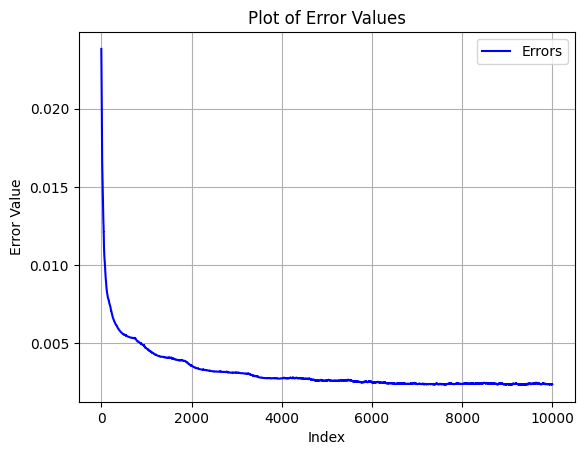

,SP_500,Target,Optimization,Abs. Diff
Mkt-RF,0.996528,1.0,1.000003,0.0000
SMB,-0.155778,0.0,-0.020539,0.0205
HML,0.018849,0.0,0.014188,0.0142


In [82]:
hahla3,hjaL3=svrg_optimizer()
port_weights=pd.DataFrame(hjaL3, index=tickers, columns=['weights'])
# port_weights['weights'] = port_weights['weights'].round(2)
port_weights
ploterror(hahla3)
portfolio_betas(port_weights)



In [84]:
mod_out_of_sample(port_weights,'2015-12-31','2016-12-31')

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


Ticker,SP_500,Optimized Portfolio
Date,,
2016-02-01,1.000000,1.000000
2016-03-01,0.995872,0.995983
2016-04-01,1.061590,1.076390
2016-05-01,1.064456,1.099147
2016-06-01,1.080768,1.126142
2016-07-01,1.081753,1.133985
2016-08-01,1.120274,1.165704
2016-09-01,1.118908,1.173046
2016-10-01,1.117527,1.180589


In [85]:
mod_out_of_sample(port_weights,'2017-12-31','2018-12-31')

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


Ticker,SP_500,Optimized Portfolio
Date,,
2017-02-01,1.000000,1.000000
2017-03-01,1.037198,1.030977
2017-04-01,1.036794,1.043493
2017-05-01,1.046220,1.079677
2017-06-01,1.058332,1.101990
2017-07-01,1.063426,1.100839
2017-08-01,1.084002,1.132185
2017-09-01,1.084594,1.145011
2017-10-01,1.105530,1.151540


In [109]:
import yfinance as yf
import pandas as pd
import numpy as np

def mod_out_of_sample3(opt_portf_weights, startd, endd):
    global oos1_daily_data
    global oos1_spy_d
    global oos1_new_performance
    global o1_start_d
    global o1_end_d
    o1_start_d = startd
    o1_end_d = endd
    
    # Download adjusted close prices for all tickers in the portfolio
    oos1_daily_data = yf.download(opt_portf_weights.index.tolist(), start=o1_start_d, end=o1_end_d, interval='1mo')
    oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)  # Remove timezone info
    
    # Download and calculate percentage change for the S&P 500
    oos1_spy_d = yf.download('^GSPC', start=o1_start_d, end=o1_end_d, interval='1mo')['Adj Close'].pct_change().dropna()
    oos1_spy_d = oos1_spy_d.tz_localize(None)  # Remove timezone info
    oos1_daily_data['SP_500'] = oos1_spy_d

    # Create a column for the optimized portfolio's returns
    oos1_daily_data['Optimized Portfolio'] = oos1_daily_data.iloc[:, :-1].dot(opt_portf_weights['weights'])

    # Calculate cumulative returns for the portfolio
    oos1_new_returns = (1 + oos1_daily_data).cumprod(axis=0)
    oos1_new_returns['Year'] = oos1_new_returns.index.year
    oos1_new_returns['Month'] = oos1_new_returns.index.month

    # Filter for December data for each year
    dec_returns = oos1_new_returns[oos1_new_returns['Month'] == 12]

    # Extract the cumulative return for December of each year
    dec_returns = dec_returns[['Year', 'SP_500', 'Optimized Portfolio']]

    # Calculate cumulative performance of the portfolio and the S&P 500
    oos1_new_performance = oos1_new_returns[['SP_500', 'Optimized Portfolio']]

    # Return the cumulative performance of the portfolio vs. S&P 500
    return oos1_new_performance,dec_returns


In [155]:
cumulativereturns2,yoyROI2=mod_out_of_sample3(port_weightss,'2019-12-31','2024-11-30')

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


In [162]:
yoyROI2

Ticker,Year,SP_500,Optimized Portfolio
Date,,,
2020-12-01,2020,1.164485,1.280358
2021-12-01,2021,1.477647,1.853248
2022-12-01,2022,1.190351,1.574182
2023-12-01,2023,1.478779,2.003810


In [156]:
cumulativereturns2

Ticker,SP_500,Optimized Portfolio
Date,,
2020-02-01,0.915890,0.907783
2020-03-01,0.801294,0.700362
2020-04-01,0.902933,0.885994
2020-05-01,0.943820,0.934952
2020-06-01,0.961175,0.973079
2020-07-01,1.014137,1.033942
2020-08-01,1.085192,1.086185
2020-09-01,1.042623,1.043884
2020-10-01,1.013778,1.055105


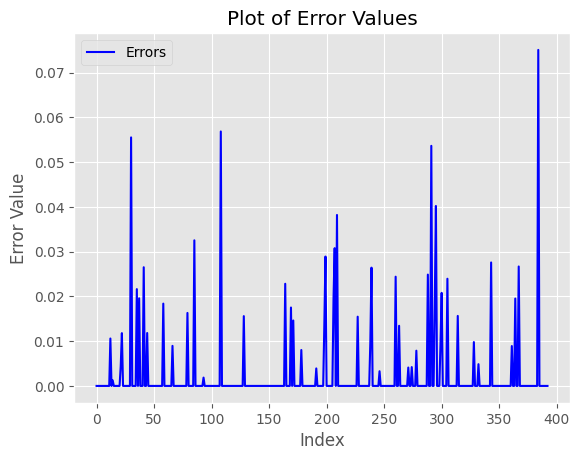

,SP_500,Target,Optimization,Abs. Diff
Mkt-RF,0.996528,1.0,1.092062,0.0921
SMB,-0.155778,0.7,0.409445,0.2906
HML,0.018849,0.7,0.497827,0.2022


In [154]:
mkt_opt, smb_opt, hml_opt = 1.0, 0.7, 0.7
learning_rate = 0.01
max_iter = 1000
batch_size = 32
tolerance = 1e-3
transaction_cost_limit = 2000  
max_stocks_in_portfolio = 50
num_assets = len(tickers)
weights = np.random.rand(num_assets)  # Random initialization of weights
weights /= np.sum(weights)
transaction_costs = t_cost
price_per_share=s_price
fhahla3,fhjaL3=svrg_optimizer()
port_weightss=pd.DataFrame(fhjaL3, index=tickers, columns=['weights'])
# port_weights['weights'] = port_weights['weights'].round(2)
port_weightss
ploterror(fhjaL3)
portfolio_betas(port_weightss)



In [153]:
cumulativereturns2

Ticker,SP_500,Optimized Portfolio
Date,,
2020-02-01,0.915890,0.913550
2020-03-01,0.801294,0.762506
2020-04-01,0.902933,0.849800
2020-05-01,0.943820,0.914764
2020-06-01,0.961175,0.929594
2020-07-01,1.014137,0.969882
2020-08-01,1.085192,1.013113
2020-09-01,1.042623,0.978255
2020-10-01,1.013778,0.985335


In [110]:
cumulativereturns,yoyROI=mod_out_of_sample3(port_weights,'2015-12-31','2019-12-31')

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


In [111]:
yoyROI

Ticker,Year,SP_500,Optimized Portfolio
Date,,,
2016-12-01,2016,1.153893,1.256695
2017-12-01,2017,1.377979,1.576403
2018-12-01,2018,1.292031,1.588923
2019-12-01,2019,1.665145,2.177433


In [115]:
import numpy as np
import pandas as pd

def monte_carlo_simulation(beta_combination):
    global mkt_opt, smb_opt, hml_opt,learning_rate,max_iter, num_assets, weights, base_weights, size
    mkt_opt, smb_opt, hml_opt = beta_combination[0], beta_combination[1], beta_combination[2]
    learning_rate = 0.01
    max_iter = 50
    batch_size = 32
    tolerance = 1e-3
    transaction_cost_limit = 2000  
    max_stocks_in_portfolio = 50
    num_assets = len(tickers)
    weights = np.random.rand(num_assets)  # Random initialization of weights
    weights /= np.sum(weights)
    transaction_costs = t_cost
    price_per_share=s_price
    size=monthly_data.shape[1]-1
    base_weights = np.ones(size) / size
    base_weights
    hahla3,hjaL3=svrg_optimizer()
    port_weights=pd.DataFrame(hjaL3, index=tickers, columns=['weights'])
    ploterror(hahla3)
    portfolio_betas(port_weights)
    cumulativereturns,yoyROI=mod_out_of_sample3(port_weights,'2015-12-31','2019-12-31')
    
    return yoyROI

# Bandit algorithm with incremental learning and exploration to maximize returns
class MaxReturnsBandit:
    def __init__(self, target_years=3):
        self.target_years = target_years  # Number of years to focus on for returns
        self.best_combination = np.array([1.0, 0.0, 0.0])  # Start with a known good combination
        self.best_return = -np.inf  # Best return found so far

    def evaluate_combination(self, beta_combination):
        # Run your Monte Carlo simulation for the given combination
        # The function will return a DataFrame containing yearly returns for SP500 and Optimized Portfolio
        simulated_df = monte_carlo_simulation(beta_combination)
        return simulated_df

    def reward_function(self, simulated_df):
        # Reward function based on the cumulative return of the Optimized Portfolio relative to the SP500
        # We want to maximize the return of the Optimized Portfolio over the years

        # Calculate cumulative returns for the Optimized Portfolio
        optimized_cumulative_return = simulated_df['Optimized Portfolio'].prod()

        # Calculate cumulative returns for the SP500
        sp500_cumulative_return = simulated_df['SP_500'].prod()

        # Reward is the ratio of optimized portfolio return over SP500 return
        reward = optimized_cumulative_return / sp500_cumulative_return
        return reward

    def select_next_combination(self):
        # Explore one beta at a time incrementally.
        # Starting from the best combination found so far, we attempt to explore one of the betas.

        # Step 1: Test a small increment to each beta and evaluate which produces the best result
        candidates = []
        for i in range(3):  # There are three betas
            new_combination = self.best_combination.copy()
            new_combination[i] += 0.1  # Increase the i-th beta slightly
            new_combination = np.clip(new_combination, 0.7, 2)  # Ensure it stays within bounds
            simulated_df = self.evaluate_combination(new_combination)
            reward = self.reward_function(simulated_df)
            candidates.append((new_combination, reward))
        
        # Step 2: Sort candidates by their reward and pick the best one
        candidates.sort(key=lambda x: x[1], reverse=True)
        
        # Step 3: If the best candidate improves on the previous best, use it
        if candidates[0][1] > self.best_return:
            self.best_combination = candidates[0][0]
            self.best_return = candidates[0][1]
            return self.best_combination
        
        # If no improvement, explore a smaller change to another beta
        return self.best_combination

    def run_bandit(self, iterations=50):
        # Run the bandit algorithm for a specified number of iterations
        for i in range(iterations):
            # Select the next combination based on exploration of one beta at a time
            new_combination = self.select_next_combination()

            # Print the current best combination and return
            print(f"Iteration {i + 1}, Best Combination: {new_combination}, Best Return: {self.best_return:.4f}")

        print("\nFinal Best Combination Found:")
        print(f"Best Combination: {self.best_combination}, Best Return: {self.best_return:.4f}")




In [164]:
import numpy as np

class MaxReturnsBandit:
    def __init__(self, target_years=3):
        self.target_years = target_years  # Number of years to focus on for returns
        self.best_combination = np.array([1.0, 0.0, 0.0])  # Start with a known good combination
        self.best_return = -np.inf  # Best return found so far
        self.combinations_history = []  # List to store the combinations and their rewards

    def evaluate_combination(self, beta_combination):
        # Run your Monte Carlo simulation for the given combination
        # The function will return a DataFrame containing yearly returns for SP500 and Optimized Portfolio
        simulated_df = monte_carlo_simulation(beta_combination)
        return simulated_df

    def reward_function(self, simulated_df):
        # Reward function based on the cumulative return of the Optimized Portfolio relative to the SP500
        # We want to maximize the return of the Optimized Portfolio over the years

        # Calculate cumulative returns for the Optimized Portfolio
        optimized_cumulative_return = simulated_df['Optimized Portfolio'].prod()

        # Calculate cumulative returns for the SP500
        sp500_cumulative_return = simulated_df['SP_500'].prod()

        # Reward is the ratio of optimized portfolio return over SP500 return
        reward = optimized_cumulative_return / sp500_cumulative_return
        return reward

    def select_next_combination(self):
        # Explore one beta at a time incrementally.
        # Starting from the best combination found so far, we attempt to explore one of the betas.

        # Step 1: Test a small increment to each beta and evaluate which produces the best result
        candidates = []
        for i in range(3):  # There are three betas
            new_combination = self.best_combination.copy()
            new_combination[i] += 0.1  # Increase the i-th beta slightly
            new_combination = np.clip(new_combination, 0.7, 2)  # Ensure it stays within bounds
            simulated_df = self.evaluate_combination(new_combination)
            reward = self.reward_function(simulated_df)
            candidates.append((new_combination, reward))
        
        # Step 2: Sort candidates by their reward and pick the best one
        candidates.sort(key=lambda x: x[1], reverse=True)
        
        # Step 3: If the best candidate improves on the previous best, use it
        if candidates[0][1] > self.best_return:
            self.best_combination = candidates[0][0]
            self.best_return = candidates[0][1]
            return self.best_combination
        
        # If no improvement, explore a smaller change to another beta
        return self.best_combination

    def run_bandit(self, iterations=50):
        # Run the bandit algorithm for a specified number of iterations
        for i in range(iterations):
            # Select the next combination based on exploration of one beta at a time
            new_combination = self.select_next_combination()

            # Store the current best combination and its reward in the history
            self.combinations_history.append({
                'Iteration': i + 1,
                'Best Combination': new_combination,
                'Best Return': self.best_return
            })

            # Print the current best combination and reward
            print(f"Iteration {i + 1}, Best Combination: {new_combination}, Best Return: {self.best_return:.4f}")

        print("\nFinal Best Combination Found:")
        print(f"Best Combination: {self.best_combination}, Best Return: {self.best_return:.4f}")
    
    def get_combinations_history(self):
        # This function returns the stored history of all combinations and rewards
        return self.combinations_history


# # Usage example:
# bandit = MaxReturnsBandit(target_years=3)
# bandit.run_bandit(iterations=10)

# # Access the combinations history for reference
# history = bandit.get_combinations_history()
# print(history)


In [166]:
history = bandit.get_combinations_history()
history

[{'Iteration': 1,
  'Best Combination': array([1. , 0.7, 0.7]),
  'Best Return': 2.7932851874905573},
 {'Iteration': 2,
  'Best Combination': array([1. , 0.8, 0.7]),
  'Best Return': 2.9561735799605895}]

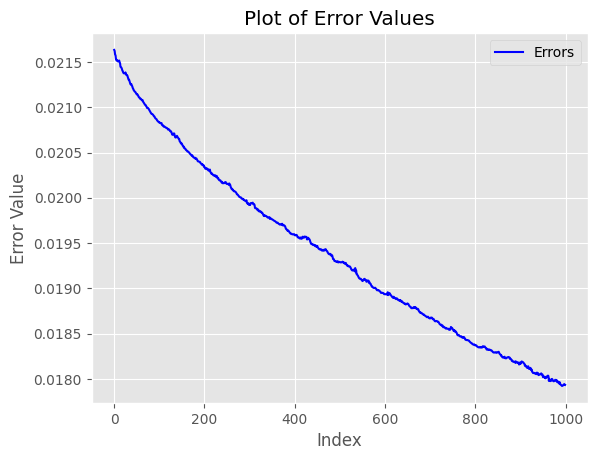

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


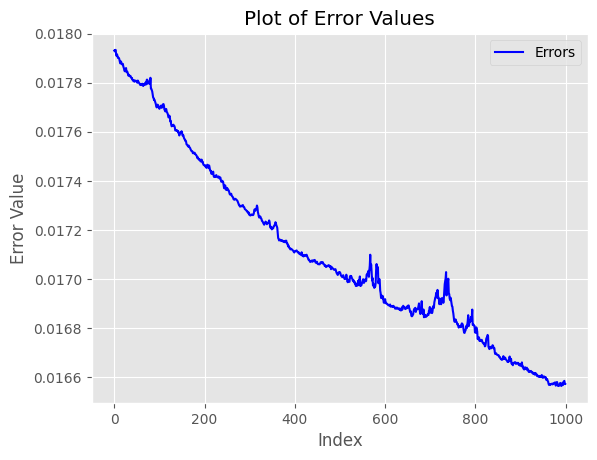

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


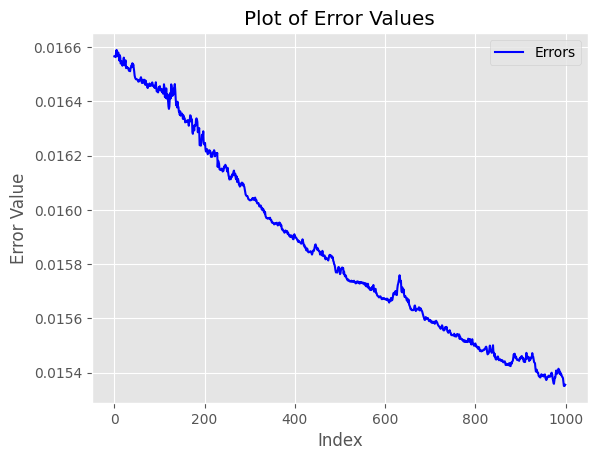

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


Iteration 1, Best Combination: [1.  0.7 0.7], Best Return: 2.7933


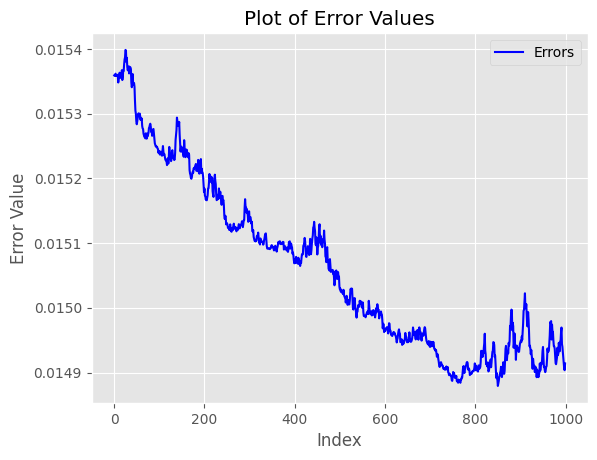

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


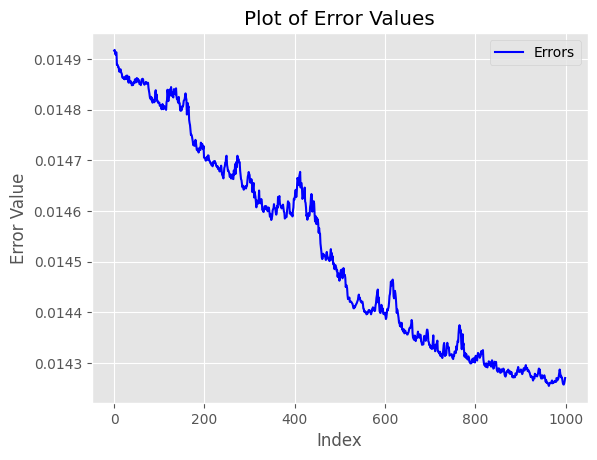

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


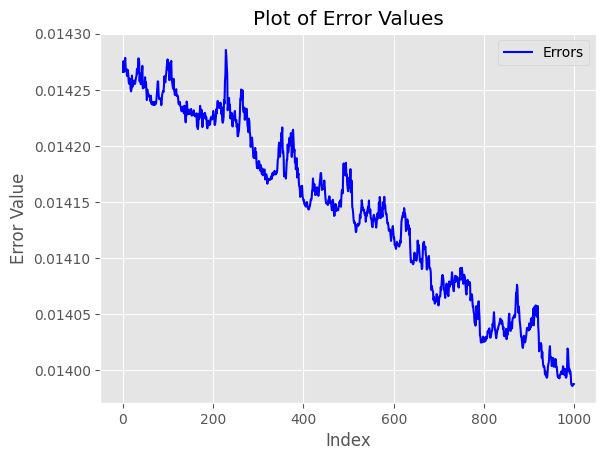

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


Iteration 2, Best Combination: [1.  0.8 0.7], Best Return: 2.9562


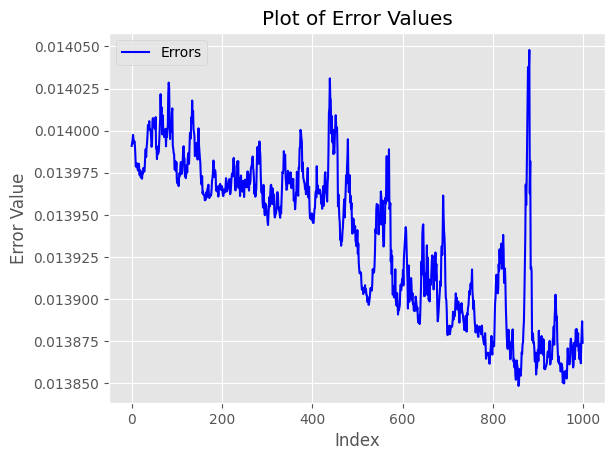

[*********************100%%**********************]  393 of 393 completed

93 Failed downloads:
['EBAY', 'CSX', 'CL', 'ADI', 'BWA', 'RJF', 'AFL', 'SNA', 'TXN', 'FE', 'MPWR', 'DUK', 'MAR', 'WAB', 'UPS', 'AIZ', 'MMC', 'AOS', 'JKHY', 'OKE', 'KR', 'NTRS', 'ROL', 'AMD', 'WST', 'FMC', 'MDLZ', 'APH', 'HOLX', 'GOOGL', 'COR', 'EMN', 'LNT', 'SCHW', 'STE', 'PG', 'PAYX', 'CNC', 'YUM', 'MSFT', 'MTD', 'EA', 'URI', 'WDC', 'DOV', 'FI', 'TJX', 'IEX', 'XOM', 'ETN', 'PGR', 'BK', 'EXC', 'MOH', 'GIS', 'LEN', 'REG', 'TPL', 'MRK', 'CLX', 'MAA', 'CCL', 'JBHT', 'MKC', 'CSCO', 'LMT', 'NDSN', 'IDXX', 'CRM', 'DLTR', 'UDR', 'SYK', 'FICO', 'CNP', 'TRMB', 'ALGN', 'WEC', 'DTE', 'TPR', 'MCHP', 'CTRA', 'AZO', 'GEN', 'KEY', 'MSI', 'NEM', 'AXON', 'BKNG', 'MTCH', 'TROW']: JSONDecodeError('Expecting value: line 1 column 1 (char 0)')
['O']: JS%ticker%NDecodeError('Expecting value: line 1 column 1 (char 0)')
['D']: JSON%ticker%ecodeError('Expecting value: line 1 column 1 (char 0)')
['SO']: J%ticker%NDecodeError('Expecting val

ValueError: attempt to get argmax of an empty sequence

In [165]:
bandit = MaxReturnsBandit(target_years=3)
bandit.run_bandit(iterations=3)

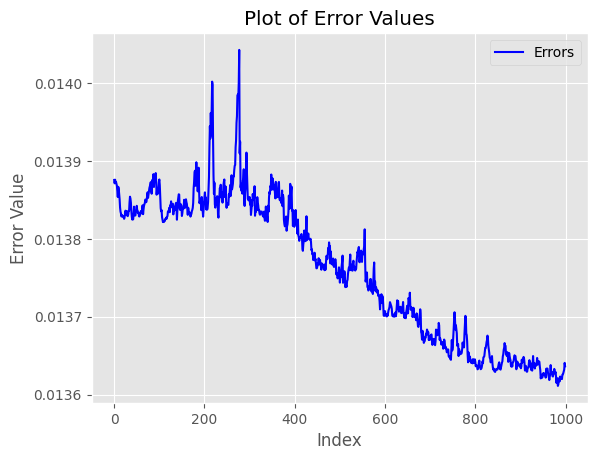

[***                    6%%                      ]  22 of 393 completed

KeyboardInterrupt: 

[*********************100%%**********************]  392 of 393 completed

In [ ]:
bandit = MaxReturnsBandit(target_years=3)
bandit.run_bandit(iterations=3)

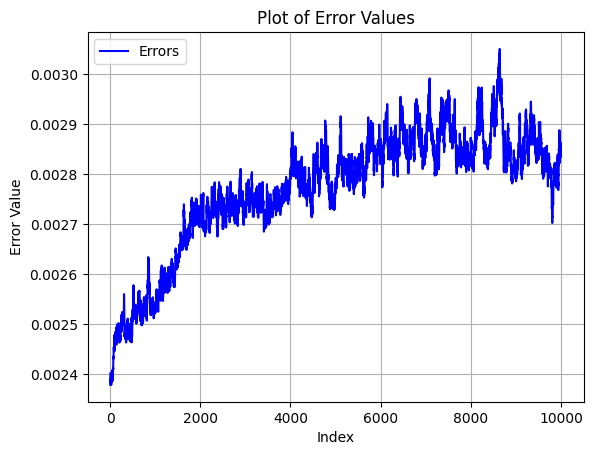

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


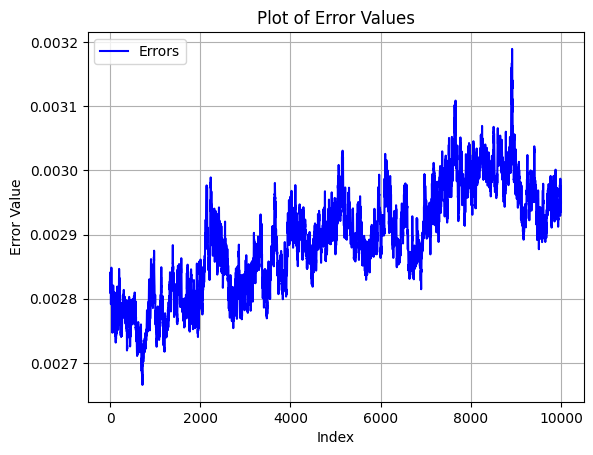

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


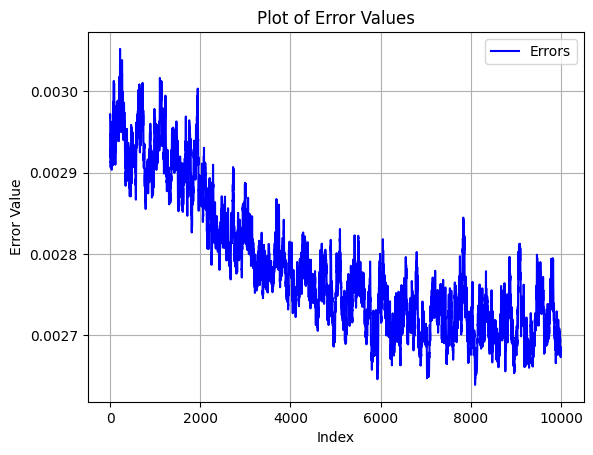

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


Iteration 1, Best Combination: [1.  0.7 0.7], Best Return: 2.2017


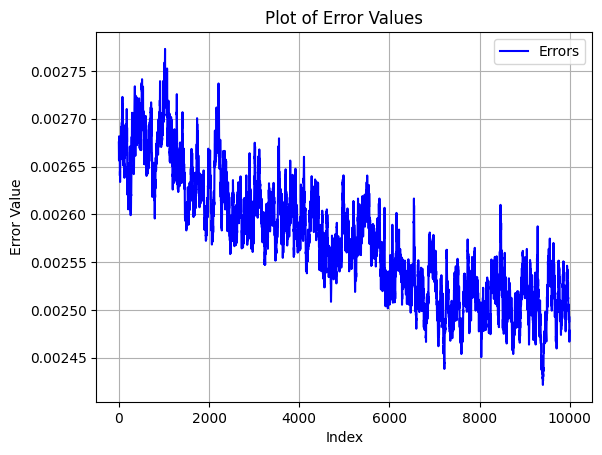

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


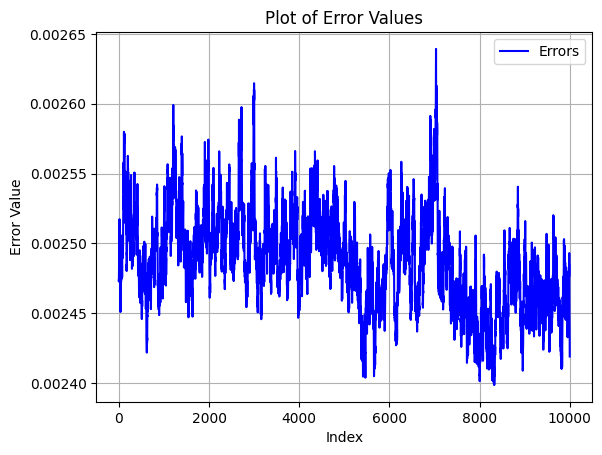

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


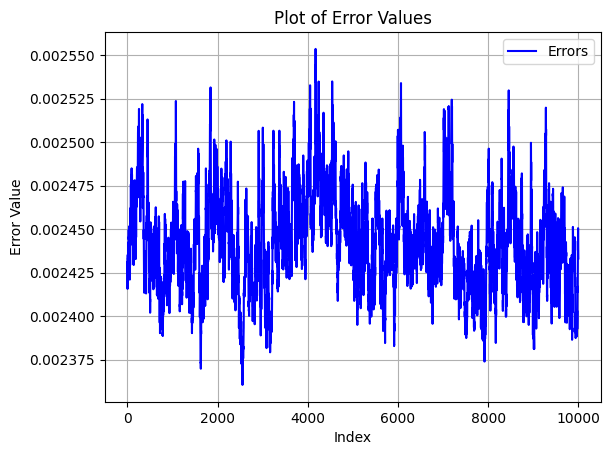

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


Iteration 2, Best Combination: [1.  0.7 0.7], Best Return: 2.2017


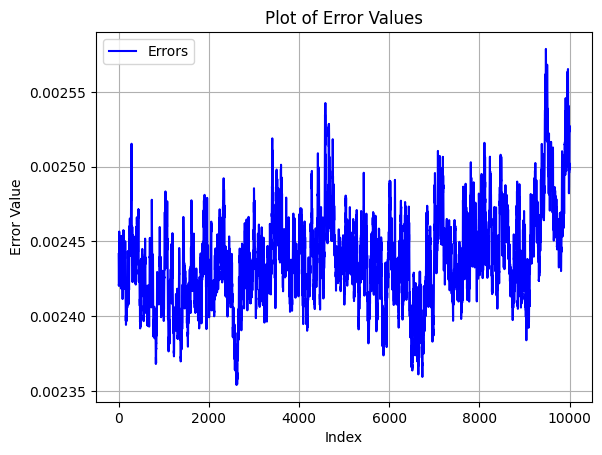

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


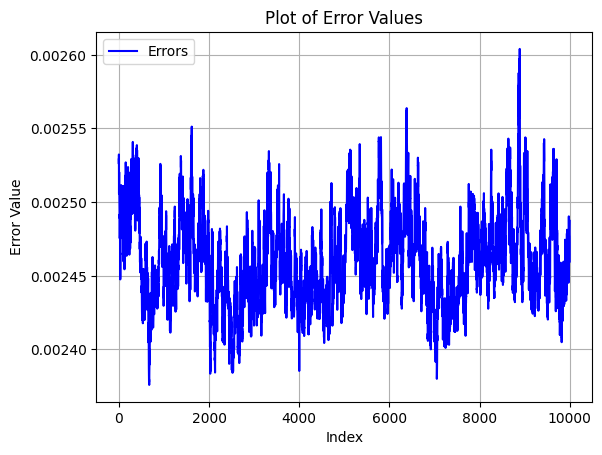

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


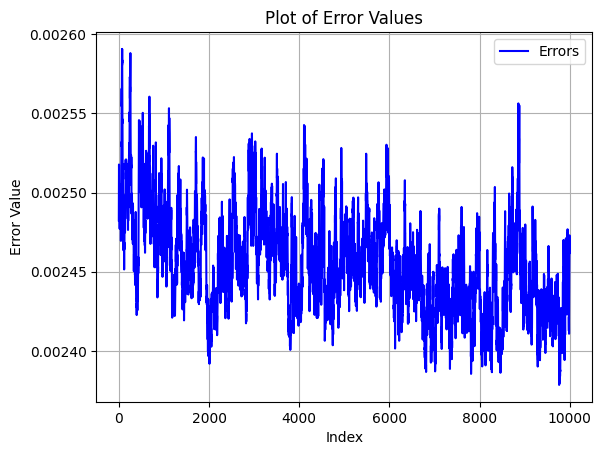

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


Iteration 3, Best Combination: [1.  0.7 0.7], Best Return: 2.2017


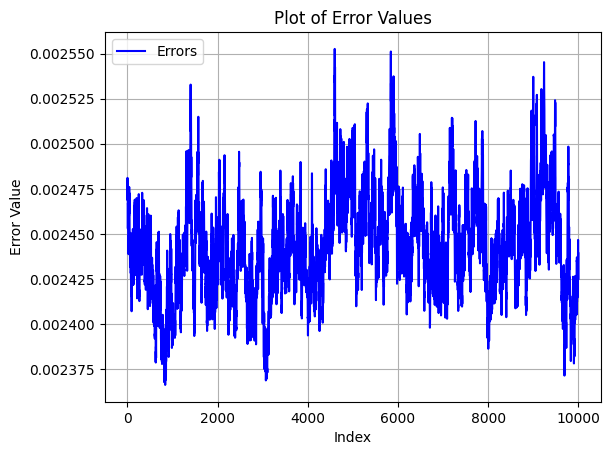

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


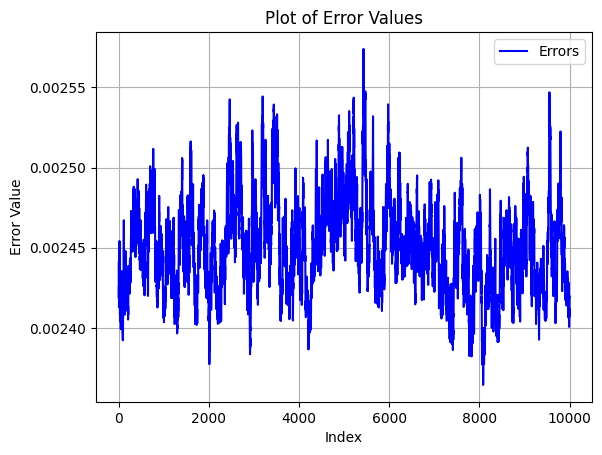

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


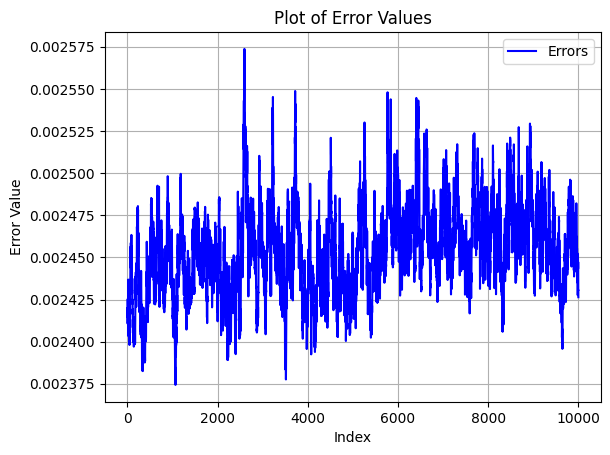

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


Iteration 4, Best Combination: [1.  0.7 0.7], Best Return: 2.2017


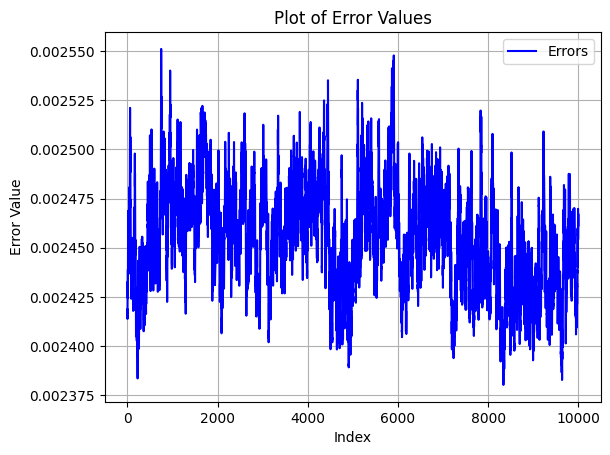

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


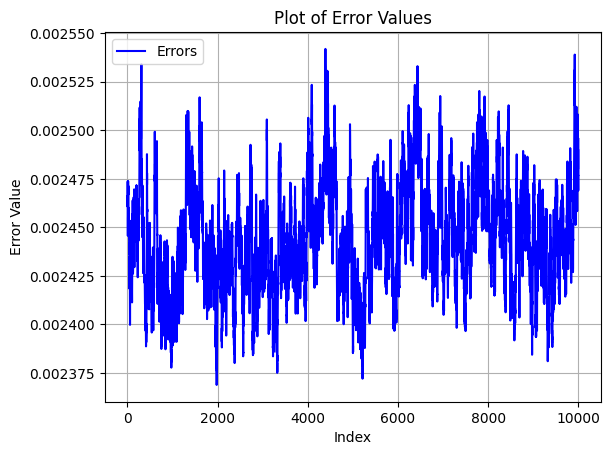

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


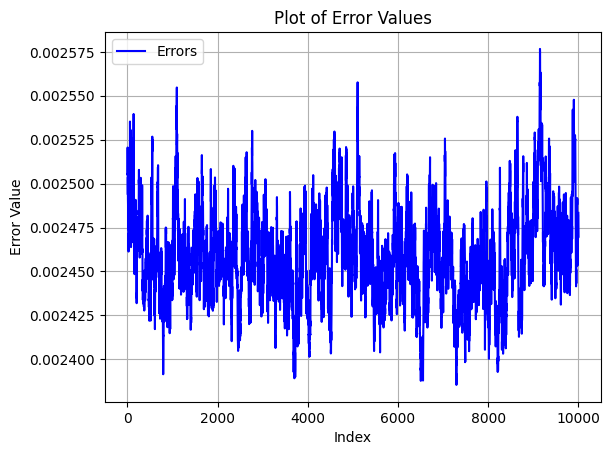

[*********************100%%**********************]  393 of 393 completed
[*********************100%%**********************]  1 of 1 completed


Iteration 5, Best Combination: [1.  0.7 0.7], Best Return: 2.2017


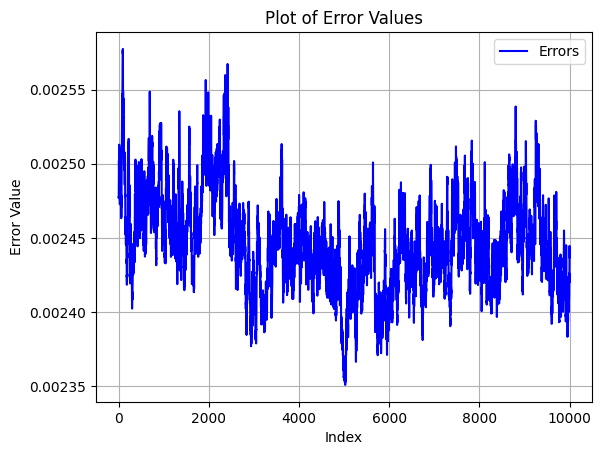

[**********************60%%***                   ]  236 of 393 completed

KeyboardInterrupt: 

[*********************100%%**********************]  392 of 393 completed

In [ ]:

bandit = MaxReturnsBandit(target_years=3)
bandit.run_bandit(iterations=10)

In [117]:
def visual(cbd):
      plt.style.use('ggplot')
      fig = plt.figure(figsize=(12,8), dpi=100)
      axes = fig.add_axes([0.1, 0.1, 0.8, 0.8])   # left, bottom, width, height (range 0 to 1)
      for i in range(0,len(oos1_daily_data.columns[-2:])):
        axes.plot(cbd.index, cbd.iloc[:,i], linewidth=1)
      axes.set_xlabel('Date')
      axes.set_ylabel('Performance')
      axes.set_title('Out of Sample 1 - Daily Performance of $1 USD of Portfolios')
      axes.legend(oos1_daily_data.columns[-2:], bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0, fontsize='small')
      plt.savefig('oos1_daily_performance.png') 
      plt.show()

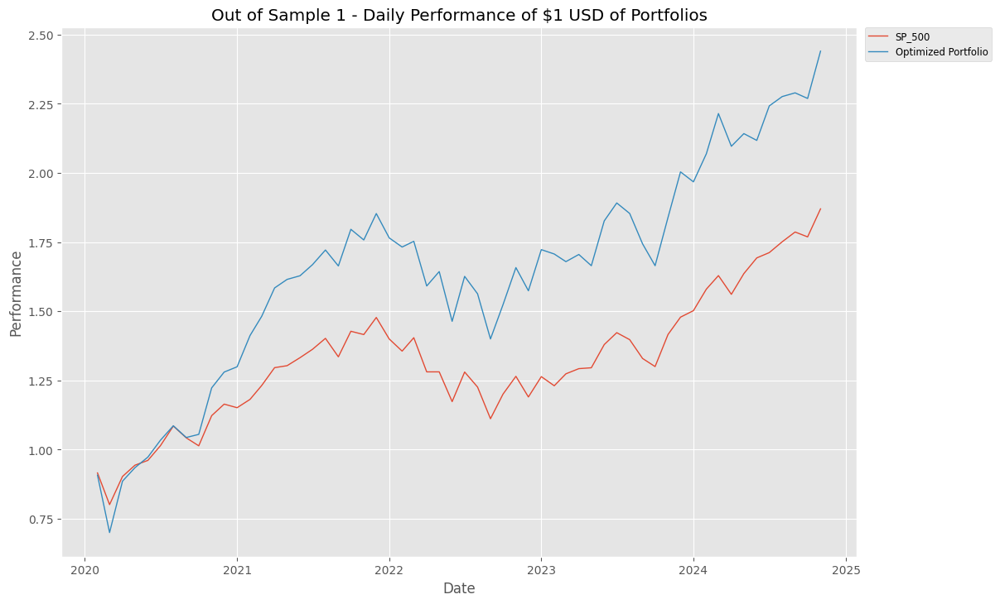

In [157]:
visual(cumulativereturns2)

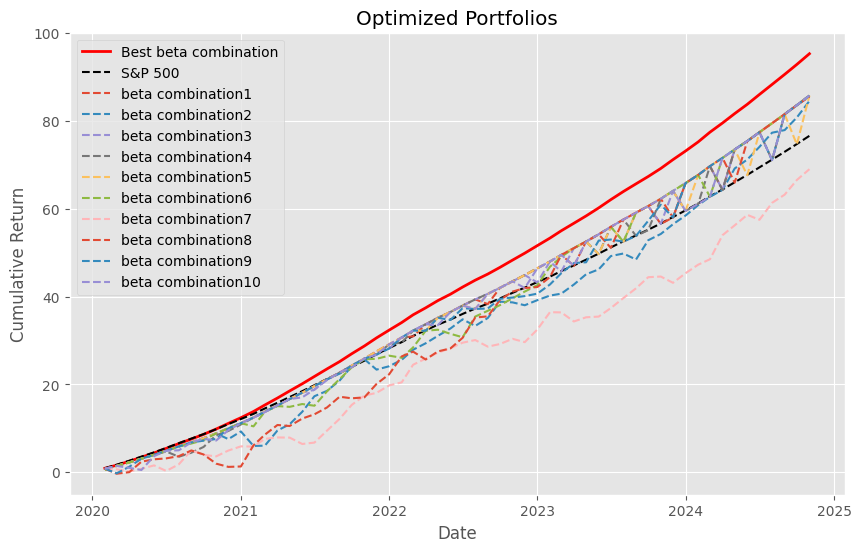

In [160]:
plot_portfolios(cumulativereturns2,10,0.2)

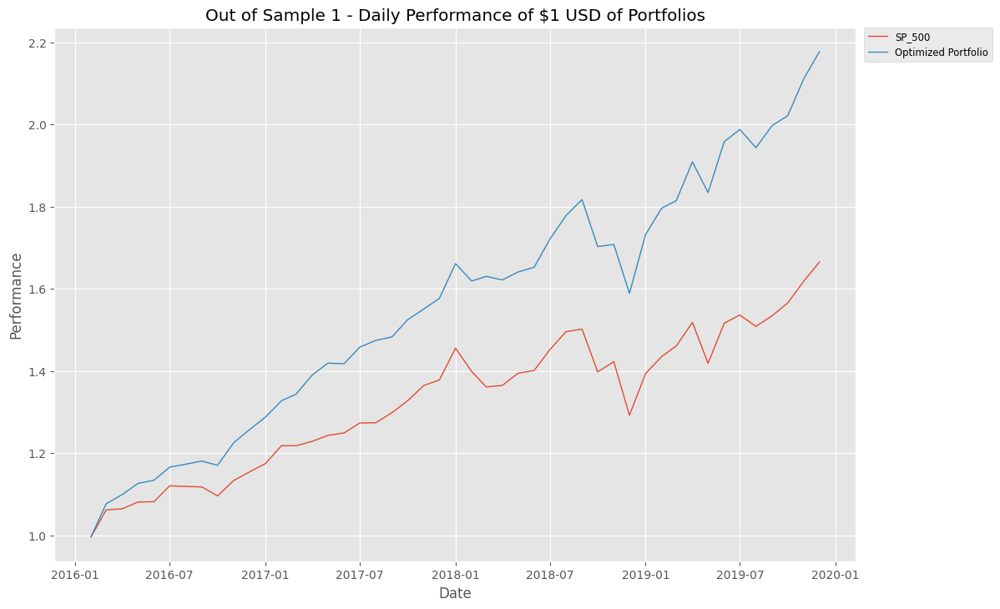

In [118]:
visual(cumulativereturns)

In [112]:
cumulativereturns

Ticker,SP_500,Optimized Portfolio
Date,,
2016-02-01,0.995872,0.995983
2016-03-01,1.061590,1.076390
2016-04-01,1.064456,1.099146
2016-05-01,1.080768,1.126142
2016-06-01,1.081753,1.133985
2016-07-01,1.120274,1.165704
2016-08-01,1.118908,1.173046
2016-09-01,1.117527,1.180589
2016-10-01,1.095818,1.170281


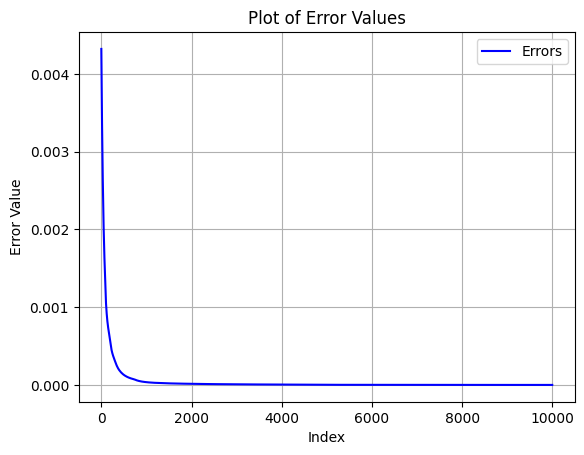

In [36]:
ploterror(hahla)

In [33]:
port_weights=pd.DataFrame(hjaL, index=tickers, columns=['weights'])
# port_weights['weights'] = port_weights['weights'].round(2)
port_weights
portfolio_betas(port_weights)

,SP_500,Target,Optimization,Abs. Diff
Mkt-RF,0.980298,1.0,0.997407,0.0026
SMB,-0.194789,0.0,-0.002949,0.0029
HML,0.018596,0.0,-0.000549,0.0005


In [119]:
port_weights

,weights
A,0.000088
AAPL,-0.000052
ABT,-0.000031
ACGL,-0.000025
ACN,-0.000020
...,...
XEL,-0.000022
XOM,-0.000027
YUM,-0.000041
ZBH,-0.000009


t0
 [ 4.40375962e-04  7.99047595e-04  2.24772896e-03  1.82675788e-03
  4.20714613e-03  1.73425942e-03  1.39104262e-03  2.86560114e-03
  1.70987774e-03  6.69042032e-04  3.52869034e-03  2.56841793e-03
  4.73669185e-04  3.85803946e-03  1.42742772e-03 -1.87855569e-04
  2.14591334e-04  1.89310996e-03  3.46290315e-03  2.95437975e-03
  2.32371335e-03  2.92092237e-03  4.13548976e-03  3.49246850e-04
  1.16513544e-03  1.29480071e-03  2.28714968e-03  1.21071431e-03
  5.27456880e-04  4.12431161e-03  3.54360561e-03  1.56006069e-05
  2.04175471e-03  1.17879559e-03  2.03075129e-05  2.48521868e-03
  2.79846204e-03  3.92914239e-03  2.04270807e-03  4.56086762e-04
  4.15494973e-04  3.62405135e-03  1.37514198e-03  4.11590543e-03
  1.57788180e-03  3.17643953e-03  4.00772932e-03  4.15033954e-03
  2.41366690e-03  1.27729553e-03  3.23014928e-03  7.95090929e-04
  4.96315384e-04  3.24320333e-03  3.52877393e-03  6.37614038e-04
  1.42544157e-03  1.75542593e-03  4.02194386e-03  3.19505849e-03
  3.06888497e-03  1.6

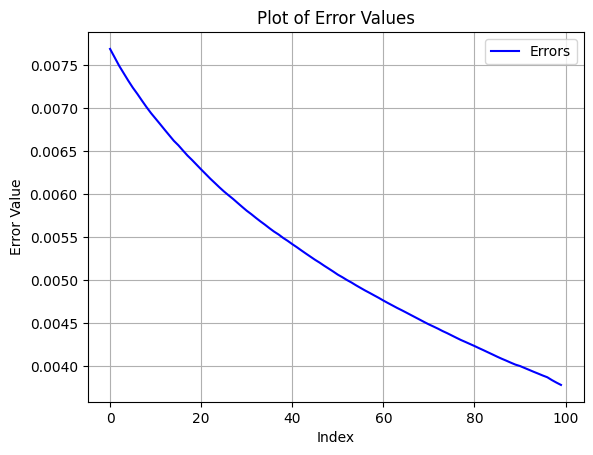

In [382]:
hahla2,hjaL2=svrg_optimizer()
ploterror(hahla2)

t0
 [ 2.76639949e-03  3.34120437e-03  2.65375014e-05  1.20267969e-03
  6.00994102e-04  4.16093582e-03  4.84841448e-03  9.35223491e-04
  2.92440355e-03  3.11991016e-03  2.24085080e-03  1.52720570e-03
 -7.21462472e-04  3.15078759e-03  2.54643884e-04  1.66003006e-03
  1.46904756e-03  1.93827335e-03  3.85291064e-03  1.76857898e-03
  4.59263643e-04  1.92022748e-03  3.31120511e-03 -9.53297424e-04
  9.18771925e-04  4.47198644e-03  4.16593320e-04  4.24989076e-03
  3.53847815e-03  2.81100347e-03  1.73577313e-03  4.63932998e-03
  1.57753443e-03  6.57844200e-04  1.31122532e-03 -6.23847468e-04
 -2.96296450e-04  5.36618004e-04  2.87692264e-03  2.08697528e-04
 -7.58633436e-04  4.75334802e-03  1.62260842e-03  2.34535737e-04
  1.43762321e-03  4.25927162e-03  3.37793948e-03 -9.07477602e-05
  4.02455213e-03  2.47063702e-03  3.34980994e-03  3.15923437e-03
  4.60991807e-03  3.61659311e-03  3.62460478e-03 -8.67692440e-04
  2.61817604e-03  1.46811359e-03  2.37052250e-03 -1.73743673e-03
 -1.76490522e-05  2.3

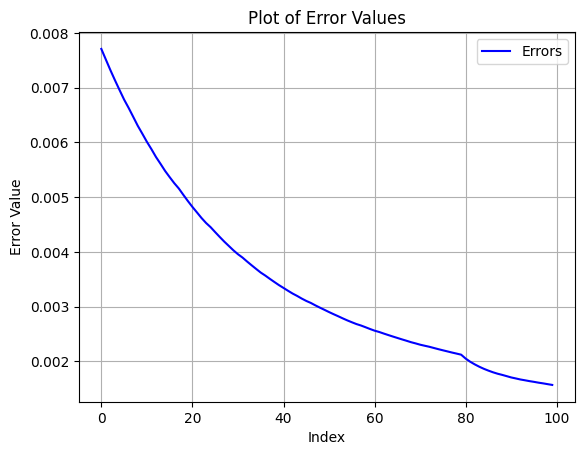

In [439]:
hahla2,hjaL2=svrg_optimizer()
ploterror(hahla2)

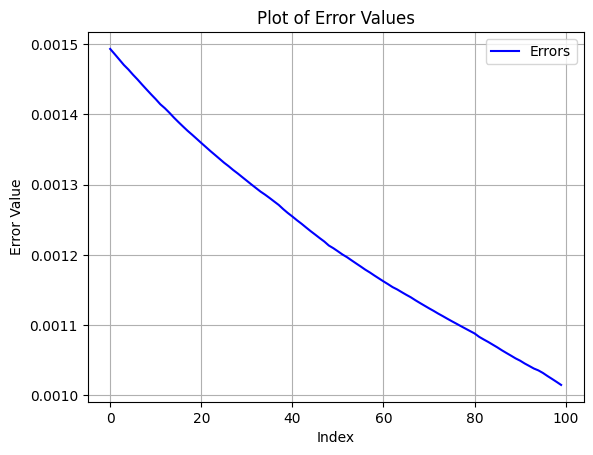

,weights
A,0.000000
AAPL,0.000000
ABBV,0.020366
ABT,0.000000
ACGL,0.000000
...,...
XYL,0.000000
YUM,0.000000
ZBH,0.000000
ZBRA,0.003669


In [29]:
hahla2,hjaL2=svrg_optimizer()
ploterror(hahla2)
port_weights=pd.DataFrame(hjaL2, index=tickers, columns=['weights'])
# port_weights['weights'] = port_weights['weights'].round(2)
port_weights

In [31]:

portfolio_betas(port_weights)

,SP_500,Target,Optimization,Abs. Diff
Mkt-RF,0.980298,1.0,1.005181,0.0052
SMB,-0.194789,0.0,-0.048661,0.0487
HML,0.018596,0.0,-0.007584,0.0076


In [ ]:
get_spy()

In [146]:
cumulativereturns

Ticker,SP_500,Optimized Portfolio
Date,,
2016-02-01,0.995872,0.995983
2016-03-01,1.061590,1.076390
2016-04-01,1.064456,1.099146
2016-05-01,1.080768,1.126142
2016-06-01,1.081753,1.133985
2016-07-01,1.120274,1.165704
2016-08-01,1.118908,1.173046
2016-09-01,1.117527,1.180589
2016-10-01,1.095818,1.170281


In [120]:
cumulativereturns

Ticker,SP_500,Optimized Portfolio
Date,,
2016-02-01,0.995872,0.995983
2016-03-01,1.061590,1.076390
2016-04-01,1.064456,1.099146
2016-05-01,1.080768,1.126142
2016-06-01,1.081753,1.133985
2016-07-01,1.120274,1.165704
2016-08-01,1.118908,1.173046
2016-09-01,1.117527,1.180589
2016-10-01,1.095818,1.170281


In [37]:

portfolio_betas(port_weights)

,SP_500,Target,Optimization,Abs. Diff
Mkt-RF,0.980298,1.0,0.997407,0.0026
SMB,-0.194789,0.0,-0.002949,0.0029
HML,0.018596,0.0,-0.000549,0.0005


In [38]:
port_weights

,weights
A,0.007415
AAPL,0.000000
ABBV,0.000000
ABT,0.037346
ACGL,0.020245
...,...
XYL,0.000000
YUM,0.000000
ZBH,0.000000
ZBRA,0.000000


In [55]:
mod_out_of_sample1(port_weights)

[*********************100%%**********************]  487 of 487 completed
[*********************100%%**********************]  1 of 1 completed


Ticker,SP_500,Optimized Portfolio
Date,,
2023-02-01,1.000000,1.000000
2023-03-01,0.973888,0.966364
2023-04-01,1.008024,1.006660
2023-05-01,1.022784,1.004598
2023-06-01,1.025323,1.008797
2023-07-01,1.091689,1.082182
2023-08-01,1.125683,1.131198
2023-09-01,1.105740,1.106235
2023-10-01,1.051869,1.042351


In [53]:
oos1_new_performance
oos1_daily_data

Empty DataFrame
Columns: [(Adj Close, A), (Adj Close, AAPL), (Adj Close, ABBV), (Adj Close, ABT), (Adj Close, ACGL), (Adj Close, ACN), (Adj Close, ADBE), (Adj Close, ADI), (Adj Close, ADM), (Adj Close, ADP), (Adj Close, ADSK), (Adj Close, AEE), (Adj Close, AEP), (Adj Close, AES), (Adj Close, AFL), (Adj Close, AIG), (Adj Close, AIZ), (Adj Close, AJG), (Adj Close, AKAM), (Adj Close, ALB), (Adj Close, ALGN), (Adj Close, ALL), (Adj Close, ALLE), (Adj Close, AMAT), (Adj Close, AMCR), (Adj Close, AMD), (Adj Close, AME), (Adj Close, AMGN), (Adj Close, AMP), (Adj Close, AMT), (Adj Close, AMZN), (Adj Close, ANET), (Adj Close, ANSS), (Adj Close, AON), (Adj Close, AOS), (Adj Close, APA), (Adj Close, APD), (Adj Close, APH), (Adj Close, APTV), (Adj Close, ARE), (Adj Close, ATO), (Adj Close, AVB), (Adj Close, AVGO), (Adj Close, AVY), (Adj Close, AWK), (Adj Close, AXON), (Adj Close, AXP), (Adj Close, AZO), (Adj Close, BA), (Adj Close, BAC), (Adj Close, BALL), (Adj Close, BAX), (Adj Close, BBY), (Adj Close, BDX), (Adj Close, BEN), (Adj Close, BG), (Adj Close, BIIB), (Adj Close, BK), (Adj Close, BKNG), (Adj Close, BKR), (Adj Close, BLDR), (Adj Close, BLK), (Adj Close, BMY), (Adj Close, BR), (Adj Close, BRO), (Adj Close, BSX), (Adj Close, BWA), (Adj Close, BXP), (Adj Close, C), (Adj Close, CAG), (Adj Close, CAH), (Adj Close, CAT), (Adj Close, CB), (Adj Close, CBOE), (Adj Close, CBRE), (Adj Close, CCI), (Adj Close, CCL), (Adj Close, CDNS), (Adj Close, CDW), (Adj Close, CE), (Adj Close, CF), (Adj Close, CFG), (Adj Close, CHD), (Adj Close, CHRW), (Adj Close, CHTR), (Adj Close, CI), (Adj Close, CINF), (Adj Close, CL), (Adj Close, CLX), (Adj Close, CMCSA), (Adj Close, CME), (Adj Close, CMG), (Adj Close, CMI), (Adj Close, CMS), (Adj Close, CNC), (Adj Close, CNP), (Adj Close, COF), (Adj Close, COO), (Adj Close, COP), (Adj Close, COR), ...]
Index: []

[0 rows x 2922 columns]

In [54]:
def mod_out_of_sample1(opt_portf_weights):
    global oos1_daily_data2
    global oos1_spy_d
    global oos1_new_performance
    global o1_start_d
    global o1_end_d
    o1_start_d = '2023-01-01'
    # last_key = list(out_of_sample_year_end.keys())[-1]
    o1_end_d   = '2024-01-01'
    oos1_daily_data2 = yf.download(opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d,interval='1mo')
    oos1_daily_data2 = oos1_daily_data2['Adj Close'].pct_change().dropna()
    oos1_daily_data2 = oos1_daily_data2.tz_localize(None)
    oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data2['SP_500'] = oos1_spy_d['Adj Close']
    oos1_daily_data2['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data2.index)):
        oos1_daily_data2.iloc[i,-1] = oos1_daily_data2.iloc[i,:-2].dot(opt_portf_weights['weights'])
    oos1_daily_data2
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data2),len(oos1_daily_data2.columns))), index = oos1_daily_data2.index, columns = oos1_daily_data2.columns)
    for j in range(1,len(oos1_daily_data2.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data2.iloc[j-1][oos1_daily_data2.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data2),2)), index = oos1_daily_data2.index, columns = oos1_daily_data2.columns[-2:])
    for j in range(1,len(oos1_daily_data2.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data2.iloc[j-1][oos1_daily_data2.columns[-2:]]+1)
    
    return oos1_new_performance

In [90]:
def mod_out_of_sample(opt_portf_weights,startd,endd):
    global oos1_daily_data
    global oos1_spy_d
    global oos1_new_performance
    global o1_start_d
    global o1_end_d
    o1_start_d = startd
    # last_key = list(out_of_sample_year_end.keys())[-1]
    o1_end_d   = endd
    oos1_daily_data = yf.download(opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d,interval='1mo')
    oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data['SP_500'] = oos1_spy_d['Adj Close']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['weights'])
    oos1_daily_data
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [99]:
def mod_out_of_sample3(opt_portf_weights,startd,endd):
    global oos1_daily_data
    global oos1_spy_d
    global oos1_new_performance
    global o1_start_d
    global o1_end_d
    o1_start_d = startd
    # last_key = list(out_of_sample_year_end.keys())[-1]
    o1_end_d   = endd
    oos1_daily_data = yf.download(opt_portf_weights.index.tolist(),start=o1_start_d,end=o1_end_d,interval='1mo')
    oos1_daily_data = oos1_daily_data['Adj Close'].pct_change().dropna()
    oos1_daily_data = oos1_daily_data.tz_localize(None)
    oos1_spy_d = pd.DataFrame(yf.download('^GSPC',start=o1_start_d,end=o1_end_d,interval='1mo')['Adj Close'].pct_change())
    oos1_spy_d = oos1_spy_d.drop(oos1_spy_d.index[0]).tz_localize(None)
    oos1_daily_data['SP_500'] = oos1_spy_d['Adj Close']
    oos1_daily_data['Optimized Portfolio'] = ''
    for i in range(len(oos1_daily_data.index)):
        oos1_daily_data.iloc[i,-1] = oos1_daily_data.iloc[i,:-2].dot(opt_portf_weights['weights'])
    oos1_daily_data
    oos1_new_returns = pd.DataFrame(np.ones((len(oos1_daily_data),len(oos1_daily_data.columns))), index = oos1_daily_data.index, columns = oos1_daily_data.columns)
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_returns.iloc[j] = oos1_new_returns.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns])
    oos1_new_performance = pd.DataFrame(np.ones((len(oos1_daily_data),2)), index = oos1_daily_data.index, columns = oos1_daily_data.columns[-2:])
    for j in range(1,len(oos1_daily_data.index)):
        oos1_new_performance.iloc[j] = oos1_new_performance.iloc[j-1]*(oos1_daily_data.iloc[j-1][oos1_daily_data.columns[-2:]]+1)
    
    return oos1_new_performance

In [60]:
z=port_weights.index

In [56]:
oos1_daily_data2

Ticker,A,AAPL,ABBV,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,...,WYNN,XEL,XOM,XYL,YUM,ZBH,ZBRA,ZTS,SP_500,Optimized Portfolio
Date,,,,,,,,,,,,,,,,,,,,,
2023-02-01,-0.066478,0.021623,0.041624,-0.079873,0.087801,-0.048378,-0.125263,0.069983,-0.039228,-0.026527,...,0.045639,-0.061073,-0.052582,-0.013076,-0.025668,-0.027250,-0.050383,0.009124,-0.026112,-0.033636
2023-03-01,-0.025569,0.118649,0.035543,-0.004522,-0.030429,0.076295,0.189597,0.074944,0.000754,0.012783,...,0.032666,0.044448,-0.002275,0.019971,0.038691,0.043029,0.059117,-0.003353,0.035052,0.041698
2023-04-01,-0.021035,0.028987,-0.051766,0.090954,0.106085,-0.019313,-0.020266,-0.087922,-0.019834,-0.011813,...,0.021178,0.036625,0.079154,-0.008214,0.064355,0.071517,-0.094245,0.056116,0.014642,-0.002048
2023-05-01,-0.145906,0.044613,-0.087083,-0.076672,-0.071533,0.091441,0.106553,-0.012175,-0.095159,-0.050045,...,-0.136332,-0.066085,-0.136556,-0.035054,-0.084578,-0.080179,-0.088394,-0.072648,0.002482,0.00418
2023-06-01,0.039595,0.094330,-0.023413,0.068823,0.073888,0.008695,0.170420,0.096348,0.069497,0.051677,...,0.070010,-0.047787,0.049618,0.123952,0.076618,0.143396,0.126671,0.056438,0.064727,0.072745
2023-07-01,0.012640,0.012785,0.110220,0.021189,0.037943,0.025180,0.116935,0.024229,0.124404,0.124983,...,0.031910,0.009008,-0.000093,0.001154,-0.006352,-0.051168,0.041003,0.092213,0.031139,0.045293
2023-08-01,-0.005749,-0.043675,-0.017516,-0.075721,-0.010684,0.023455,0.024113,-0.088959,-0.066620,0.029726,...,-0.069738,-0.089271,0.036833,-0.081685,-0.060216,-0.137749,-0.106994,0.012866,-0.017716,-0.022068
2023-09-01,-0.076402,-0.088678,0.014290,-0.058795,0.037080,-0.051456,-0.088390,-0.036803,-0.048928,-0.055104,...,-0.088479,0.001575,0.057469,-0.120823,-0.034318,-0.057925,-0.139922,-0.086767,-0.048719,-0.057749
2023-10-01,-0.075568,-0.002570,-0.052865,-0.023748,0.087442,-0.032627,0.043460,-0.101434,-0.051047,-0.092942,...,-0.050103,0.035827,-0.099762,0.027573,-0.032656,-0.069595,-0.114573,-0.097597,-0.021980,-0.017239


In [ ]:
import numpy as np
import pandas as pd
import random

# Define Monte Carlo simulation function (user-provided) to evaluate downside protection
def monte_carlo_simulation(beta_combination):
    # Placeholder for the actual Monte Carlo function that evaluates downside protection
    # Returns the downside protection metric for the given combination
    return np.random.uniform(-0.5, 0.5)  # Replace with actual simulation logic

class BanditAlgorithm:
    def __init__(self, num_combinations, num_factors=3, target_years=3):
        self.num_combinations = num_combinations
        self.num_factors = num_factors
        self.target_years = target_years
        self.explored_combinations = set()
        self.best_combinations = []
        self.results = []

    def generate_new_combination(self):
        # Generate a new random combination within predefined ranges (e.g., 0 to 1)
        while True:
            combination = tuple(np.round(np.random.uniform(0, 1, self.num_factors), 2))
            if combination not in self.explored_combinations:
                self.explored_combinations.add(combination)
                return combination

    def run(self, num_iterations=100):
        for _ in range(num_iterations):
            new_combination = self.generate_new_combination()
            downside_protection = monte_carlo_simulation(new_combination)
            
            # Store the result if it meets the target criteria
            self.results.append((new_combination, downside_protection))
            if len(self.results) >= self.target_years:
                last_n_results = [res[1] for res in self.results[-self.target_years:]]
                if all(dp < 0 for dp in last_n_results):  # Example condition: downside < 0
                    self.best_combinations.append(new_combination)

        # Create a DataFrame for final results
        return pd.DataFrame(self.results, columns=['Combination', 'Downside Protection'])

# Specify number of iterations and initialize the algorithm
bandit = BanditAlgorithm(num_combinations=100, target_years=3)
result_df = bandit.run(num_iterations=50)

# Display the results
print(result_df)


In [32]:
port_betas

,SP_500,Target,Optimization,Abs. Diff
Mkt-RF,0.980298,1.0,1.005181,0.0052
SMB,-0.194789,0.0,-0.048661,0.0487
HML,0.018596,0.0,-0.007584,0.0076


In [31]:
def portfolio_betas(pweights):
    # CHECK PORTFOLIO BETAS
   
    global port_betas
    port_returns = pd.DataFrame(np.zeros((len(monthly_data.index),2)), index=monthly_data.index, columns=["SP_500","Optimization"])
    for j in port_returns.index:
        port_returns.loc[j]["SP_500"] = monthly_data.loc[j]['SP_500']
        port_returns.loc[j]['Optimization'] = monthly_data.loc[j,:monthly_data.columns[-2]].dot(pweights['weights'])
    port_returns = port_returns.merge(ff3_monthly[['Mkt-RF','SMB','HML']], left_index=True, right_index=True)
    # Create an empty DataFrame to store the Portfolio Beta
    port_betas = pd.DataFrame(np.zeros((3,4)), index=ff3_monthly.columns[0:3], columns=["SP_500", "Target", "Optimization", "Abs. Diff"])
    port_betas["Target"] = [mkt_opt, smb_opt, hml_opt]# Set the independent variables (Fama French 3 Factors)
    X = port_returns[['Mkt-RF','SMB','HML']]
    # Set the dependent variable (Return of Portfolio)
    Y = port_returns['SP_500']# Fit the multiple linear regression model
    regr = LinearRegression()
    regr.fit(X,Y)
    port_betas['SP_500'] = regr.coef_
    # Set the dependent variable (Return of Portfolio)
    Y = port_returns['Optimization']
    # Fit the multiple linear regression model
    regr = LinearRegression()
    regr.fit(X,Y)
    port_betas['Optimization'] = regr.coef_
    # Abs Difference between Target Betas & Optimal Portfolio Betas
    port_betas["Abs. Diff"] = round(abs(port_betas['Optimization'] - port_betas["Target"]),4)
    port_betas
    return port_betas
    

In [456]:
port_weights=pd.DataFrame(hjaL2, index=tickers, columns=['weights'])
# port_weights['weights'] = port_weights['weights'].round(2)
port_weights

,weights
A,0.0
AAPL,0.0
ABBV,0.0
ABT,0.0
ACGL,0.0
...,...
XYL,0.0
YUM,0.0
ZBH,0.0
ZBRA,0.0


In [445]:
hjaL2

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.01426601, 0.02629689, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.01705781, 0.        , 0.02576504, 0.        , 0.        ,
       0.        , 0.01168931, 0.        , 0.        , 0.        ,
       0.00606712, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.0361748 , 0.        , 0.        , 0.        ,
       0.02282663, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.01441247, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

In [28]:
size=monthly_data.shape[1]-1
base_weights = np.ones(size) / size
base_weights

array([0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205

In [377]:
print(hjaL)

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.0153782  0.02017949
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.01826565 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.01519556 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.03316514 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

In [379]:
hahla

[0.005806578165331228,
 0.005722839854102633,
 0.005636549414200345,
 0.005546773424185652,
 0.005465007569261369,
 0.0053971410269765315,
 0.005320421961477062,
 0.005246908665751668,
 0.005175419338902176,
 0.005114056965078002,
 0.005049296158616858,
 0.004985161473797587,
 0.004923044602876086,
 0.004872968937140864,
 0.004813081730300341,
 0.0047584455171637615,
 0.004704543586731397,
 0.004657420739568014,
 0.0046076159306870325,
 0.004557081223747419,
 0.004509813553918388,
 0.004471979708010247,
 0.004427743192826049,
 0.004384323835685358,
 0.004343428053702102,
 0.0043099066127948995,
 0.004277893751032837,
 0.004237694413807782,
 0.004199963475047095,
 0.004163918124722489,
 0.00413459834945498,
 0.0040999070630093025,
 0.004066406584051719,
 0.004032650979782594,
 0.004000668212550154,
 0.003974161325547254,
 0.003942790169688637,
 0.003912601550552829,
 0.003883928635370218,
 0.003859108404298811,
 0.0038298341273985946,
 0.0038031432415717333,
 0.0037750804071353746,
 0.0

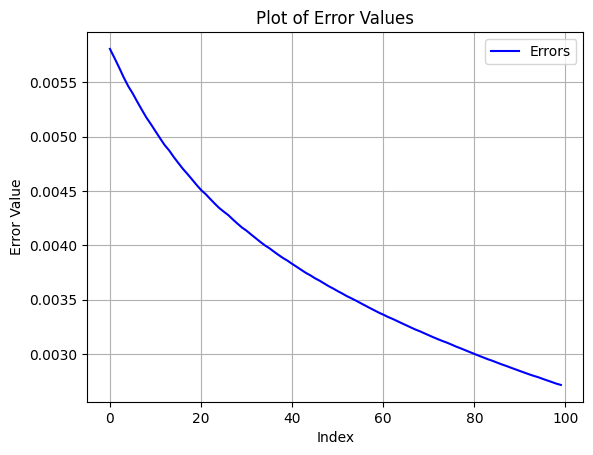

In [378]:
ploterror(hahla)

In [32]:
def ploterror(ndak):
    x_values = np.arange(len(ndak))
    plt.plot(x_values, ndak, linestyle='-', color='b', label="Errors")

    plt.xlabel('Index')
    plt.ylabel('Error Value')
    plt.title('Plot of Error Values')

    plt.grid(True)

    plt.legend()
    plt.show()

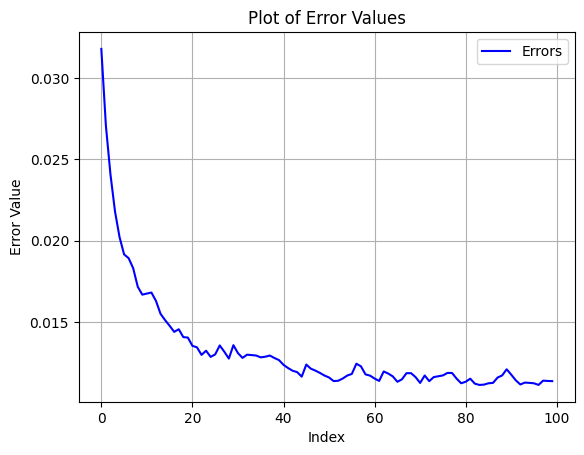

In [ ]:
ploterror(hsdh)

In [ ]:
hsdh,shkal=svrg_optimizer(monthly_data, ff3_monthly, 1, 0, 0, base_weights, max_iter=100, batch_size=32, learning_rate=0.01)

Iteration 0, Loss: 0.0317932699460562
Iteration 10, Loss: 0.015660256625894316
Iteration 20, Loss: 0.013063989591040997
Iteration 30, Loss: 0.011847075085357539
Iteration 40, Loss: 0.011249339032603807
Iteration 50, Loss: 0.01105085385644469
Iteration 60, Loss: 0.011029485158800166
Iteration 70, Loss: 0.010763268526380997
Iteration 80, Loss: 0.011043801686625441
Iteration 90, Loss: 0.011293458205346718


In [ ]:
hsdh,shkal,whsjh=svrg_optimizer2(monthly_data.iloc[:,:-1], ff3_monthly, 1, 0, 0, base_weights, max_iter=100, batch_size=32, learning_rate=0.01)

Iteration 0, Loss: 0.006396797538038582
Iteration 10, Loss: 57.6443211647119
Iteration 20, Loss: 10432792.862661043
Iteration 30, Loss: 1306059189880.0745
Iteration 40, Loss: 2.2639378164541542e+17
Iteration 50, Loss: 3.2549709046667853e+22
Iteration 60, Loss: 4.490901961542659e+27
Iteration 70, Loss: 6.449214827045029e+32
Iteration 80, Loss: 6.044304876909002e+37
Iteration 90, Loss: 8.142136040331428e+42


In [ ]:
whsjh

[array([ 3.37001823e+21,  3.78536199e+21,  2.73505002e+21,  2.27224152e+21,
         1.69371322e+21,  3.98609007e+21,  3.72190499e+21,  3.64647835e+21,
         2.77859639e+21,  2.62613103e+21,  4.70286947e+21,  1.18702884e+21,
         9.25714071e+20,  2.71300599e+21,  3.22611605e+21,  3.63357347e+21,
         8.48060129e+20,  2.36011967e+21,  2.25800338e+21,  5.27584069e+21,
         4.06342645e+21,  1.73871768e+21,  2.90014685e+21,  5.52795936e+21,
         2.49613007e+21,  5.76013346e+21,  3.83212569e+21,  2.24005898e+21,
         4.23923786e+21,  1.90320083e+21,  3.55706554e+21,  4.33656166e+21,
         3.32552681e+21,  2.68860092e+21,  3.67144718e+21,  1.57204710e+22,
         2.61319814e+21,  3.96261108e+21,  6.28551948e+21,  3.22085859e+21,
         1.80318673e+21,  2.65019022e+21,  4.07695892e+21,  2.82936464e+21,
         1.70840986e+21,  3.56818370e+21,  3.91907888e+21,  2.34361590e+21,
         3.86832448e+21,  4.20158465e+21,  2.08719271e+21,  1.35553627e+21,
         4.1

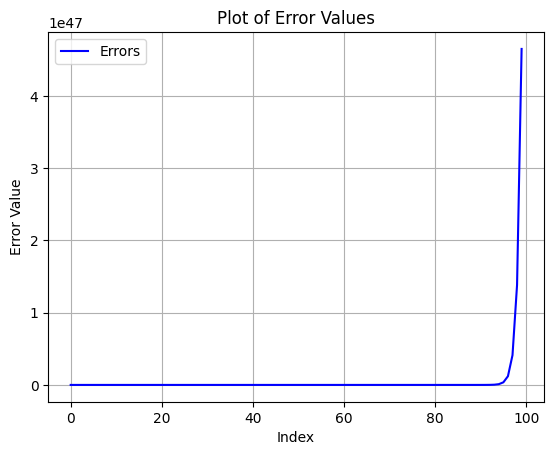

In [ ]:
ploterror(hsdh)

In [ ]:


# Convert the array to a Pandas DataFrame
dfsj = pd.DataFrame(hjaL, columns=['Value'])

# Convert to percentage by multiplying by 100 and round off to 2 decimal places
dfsj['Value'] = (dfsj['Value'] * 100).round(2)

dfsj


,Value
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
482,0.0
483,0.0
484,0.0
485,0.0


In [ ]:
dfsj.to_csv('sjda.csv')

In [ ]:
fgsaj=gradient(base_weights,monthly_data,ff3_monthly,1,0,0)

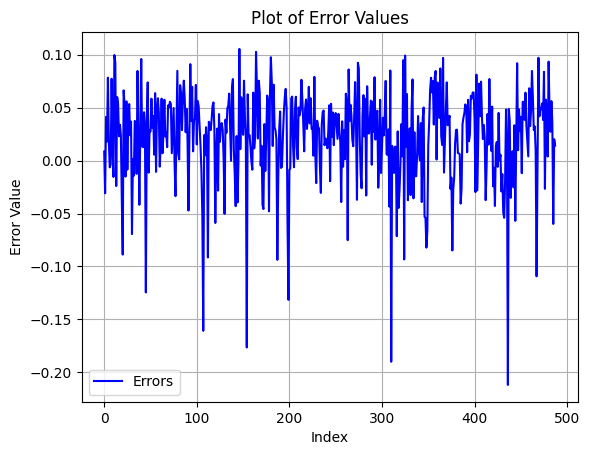

In [ ]:

x_values = np.arange(len(fgsaj))
plt.plot(x_values, fgsaj, linestyle='-', color='b', label="Errors")

plt.xlabel('Index')
plt.ylabel('Error Value')
plt.title('Plot of Error Values')

plt.grid(True)

plt.legend()
plt.show()


In [ ]:
from scipy.optimize import minimize

In [ ]:
size=monthly_data.shape[1]-1
base_weights = np.ones(size) / size
base_weights

array([0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205339,
       0.00205339, 0.00205339, 0.00205339, 0.00205339, 0.00205

In [ ]:
error_term(base_weights,monthly_data.iloc[:,:-1],ff3_monthly,1,0,0)

0.008864381804185782